# Сборный проект-5. Поиск по изображениям

Заказчик - фотохостинг для профессиональных фотографов «Со Смыслом» (“With Sense”). Пользователи сервиса размещают свои фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т. д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала.<br>

В компании проводится эксперимент по разработке поиска референсных фотографий для фотографов. Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены, а сервис выводит несколько фотографий с такой же или похожей сценой.<br>

Чтобы эксперимент получил право на жизнь, нужно защитить его перед руководством компании. Для защиты необходимо презентовать PoC (Proof of Concept, Проверка концепции) — продемонстрировать, что такой проект практически осуществим.<br><br>

**Юридические ограничения**<br>
В некоторых странах, где работает компания With Sense, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.
В сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:<br>

*"This image is unavailable in your country in compliance with local laws."*<br>

Однако в PoC нет возможности воспользоваться данным функционалом. Поэтому необходимо очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер.
<br><br>

<span style='font-size: 18px;'><b>Цель исследования</b><span>

Необходимо разработать демонстрационную версию поиска изображений по запросу. Для демонстрационной версии нужно выбрать лучшую  модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу. На основе лучшей модели можно будет собрать предварительную версию продукта, которую презентуют руководителю компании.
<br><br>


<span style='font-size: 18px;'><b>Описание данных</b><span>

1. В файле `train_dataset.csv` находится информация, необходимая для обучения:

    - имя файла изображения;
    - идентификатор описания;
    - текст описания.

    Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

2. В папке `train_images` содержатся изображения для тренировки модели.

3. В файле `CrowdAnnotations.tsv`  — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

    - имя файла изображения;
    - идентификатор описания;
    - доля людей, подтвердивших, что описание соответствует изображению;
    - количество человек, подтвердивших, что описание соответствует изображению;
    - количество человек, подтвердивших, что описание не соответствует изображению.

4. В файле `ExpertAnnotations.tsv` — данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

    - имя файла изображения;
    - идентификатор описания;
    - 3, 4, 5 — оценки трёх экспертов.

    Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

5. В файле `test_queries.csv` находится информация, необходимая для тестирования:

    - идентификатор запроса;
    - текст запроса;
    - релевантное изображение.

    Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

6. В папке `test_images` содержатся изображения для тестирования модели.
<br><br>

<span style='font-size: 18px;'><b>Ход выполнения</b><span>

Шаг 1. Загрузка данных<br>
Шаг 2. Подготовка данных<br>
Шаг 3. Анализ данных<br>
&emsp;&emsp;3.1. Визуализация временного ряда<br>
&emsp;&emsp;3.2. Индивидуальный анализ признаков<br>
&emsp;&emsp;3.3. Сравнительный анализ признаков<br>
&emsp;&emsp;3.4. Корреляционный анализ признаков<br>
Шаг 4. Обучение моделей<br>
Шаг 5. Предсказание лучшей модели и оценка качества<br>
Шаг 6. Общий вывод<br>
Шаг 7. Баг-репорт

<!-- **Импорт библиотек, настройки, константы, объявление функций** -->
## Импорт библиотек, настройки, константы, объявление функций

Выполним установку необходимых библиотек.

In [1]:
# выполняю установку библиотек в "тихом" режиме
! pip install -q tqdm
! pip install -q torch
! pip install -q transformers
! pip install -q optuna-integration
! pip install -q catboost==1.2.3

Импортируем библиотеки используемые в проекте.

In [2]:
# импортирую библиотеки
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import time
import math
from math import ceil, floor, sqrt
import statsmodels.api as sm
from scipy import stats as st
import random
import warnings
from PIL import Image
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
from nltk.corpus import wordnet
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score, GroupShuffleSplit, KFold
from sklearn.metrics import mean_squared_error


# импорт нестандартных библиотек
from tqdm.auto import tqdm
import torch
import torch.nn as nn
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam
from transformers import BertTokenizer, BertModel
from optuna.integration import OptunaSearchCV
from optuna import distributions
import catboost
from catboost import CatBoostRegressor


# загружаю пакеты для nltk
nltk.download('omw-1.4')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
pass

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Evgeniy\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Evgeniy\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Evgeniy\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Evgeniy\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


Выполним настройки и зададим константы.

In [3]:
# задаю настройки
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
pd.options.display.float_format ='{:,.3f}'.format
sns.set_theme(style='whitegrid', palette='pastel')
sns.set_context(
    'notebook',
    rc={
        'font.size':12,
        'axes.titlesize':16,
        'axes.labelsize':12,
        'legend.fontsize':12,
        'figure.figsize':(14, 7)
    }
)
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.options.mode.chained_assignment = None

# задаю класс для стилизации вывода метода .print()
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

# создаю константу для пропорционального разделения
# датасета на тренировочныую и тестовую выборки
TEST_SIZE = 0.30

# задаю константы
RANDOM_STATE = 42

# включаю визуализацию прогресса выполнения операций с данными в Pandas
tqdm.pandas()

# создаю флаг для использования подготовленных файлов или их перерасчёт
use_prepared_files = 0

Создадим функцию для исследовательского анализа данных, что оптимизирует процесс описания данных.

In [4]:
# создаю функцию для описания данных
def describe_data(d_fr, d_col):

    """
    describe_data(d_fr, d_col)

    Функция для статического и графического описания данных признака датасета.

    Для числовых колонок (не дискретных: с числом уникальных значений > 25)
    представлен набор из 15 характеристик - расширенная версия метода .describe().
    Графики: гистограмма (bins=30), квантильный-квантильный, диаграмма размаха.

    Для числовых дискретных колонок (с числом уникальных значений <= 25)
    выводятся стандартные характеристики метода .describe() с кол-вом пропусков.
    Графики: горизонтальный столбчатый график, круговая диаграмма.

    Для категориальных и числовых дискретных колонок
    выводятся стандартные характеристики метода .describe() с кол-вом пропусков.
    Графики: горизонтальный столбчатый график, круговая диаграмма.

    Для столбцов с датами выводятся характеристики метода .describe(),
    также количество уникальных значений, пропусков, доли топ-10 по частоте значений.
    График: гистограмма по году

    Аргументы функции:
        d_fr - датафрейм
        d_col - наименование колонки

    Пример использования:
        data = pd.read_csv('my_file.csv')
        describe_data(data, 'my_column')
    """


# в зависимости от типа данных в столбце строю разные типы графиков

# ЧИСЛОВОЙ столбец (с количеством уникальных значений больше 25)
    if  d_fr[d_col].dtypes != "object" and \
        d_fr[d_col].dtypes != "datetime64[ns]" and \
        len(d_fr[d_col].unique()) > 25:

        # описываю статистические параметры столбца данных
        print('\n' + color.BOLD + color.BLUE + \
              f'Описание столбца (числовой, type: {d_fr[d_col].dtypes}):' + \
              color.END)
        display(
            pd.DataFrame(
                data={
                    'Значения':
                    [
                        d_fr[d_col].describe()[0],
                        d_fr[d_col].isna().sum(),
                        len(d_fr[d_col].unique()),
                        d_fr[d_col].mode()[0],
                        d_fr[d_col].describe()[1],
                        d_fr[d_col].var(),
                        d_fr[d_col].describe()[2],
                        d_fr[d_col].std() / math.sqrt(len(d_fr[d_col])),
                        d_fr[d_col].describe()[3],
                        d_fr[d_col].describe()[4],
                        d_fr[d_col].describe()[5],
                        d_fr[d_col].describe()[6],
                        d_fr[d_col].describe()[7],
                        d_fr[d_col].max() - d_fr[d_col].min(),
                        st.shapiro(d_fr[d_col]).statistic
                      ]},
                index=[
                        'Количество',
                        'Пропуски',
                        'Уникальных',
                        'Мода',
                        'Среднее арифметическое',
                        'Дисперсия',
                        'Стандартное отклонение',
                        'Ошибка выборочного среднего',
                        'Минимум',
                        'Квартиль 25%',
                        'Медиана',
                        'Квартиль 75%',
                        'Максимум',
                        'Размах',
                        'Тест Шапиро-Вилка'
                    ]
            )
        )
        print()

        # делаю сетку для 3 графиков методом subplots
        fig, axs = plt.subplots(1, 3, sharex=False, sharey=False, figsize=(15, 5))

        # гистограмма
        sns.histplot(
            d_fr[d_col],
            bins=30,
            # kde=True,
            ax=axs[0]
        )
        axs[0].ticklabel_format(axis='x')
        axs[0].set_xlabel('\n ' + d_col.capitalize())
        axs[0].set_ylabel('Количество \n')
        axs[0].set_title('Гистограмма \n для ' + d_col.capitalize() + '\n',
                         color='black', fontweight ='bold')
        axs[0].grid(linestyle='--')

        # QQ plot
        sm.qqplot(
            d_fr[d_col],
            line='s',
            ax=axs[1]
        )
        axs[1].set_xlabel('\n Theoretical Quantiles')
        axs[1].set_ylabel('Sample Quantiles \n')
        axs[1].set_title('«Квантильный-квантильный»\n график \n', color='black', fontweight='bold')
        axs[1].grid(linestyle='--')

        # диаграмма размаха
        sns.boxplot(
            y=d_fr[d_col],
            ax=axs[2]
        )
        axs[2].ticklabel_format(axis='y')
        axs[2].set_xlabel('\n ' + d_col.capitalize())
        axs[2].set_ylabel('Значение \n')
        axs[2].set_title('Диаграмма размаха \n для ' + d_col.capitalize() + '\n',
                         color='black', fontweight ='bold')
        axs[2].grid(linestyle='--')



# ЧИСЛОВОЙ ДИСКРЕТНЫЙ столбец (с количеством уникальных значений меньше или равно 25)
    elif d_fr[d_col].dtypes != "object" and \
        d_fr[d_col].dtypes != "datetime64[ns]" and \
        len(d_fr[d_col].unique()) <= 25:

        # описываю статистические параметры столбца данных
        print('\n' + color.BOLD + color.BLUE + \
              f'Описание столбца (числовой дискретный, type: {d_fr[d_col].dtypes}):' + \
              color.END)
        display(
            pd.DataFrame(
                data={
                    'Значения':
                    [
                        d_fr[d_col].describe()[0],
                        d_fr[d_col].isna().sum(),
                        len(d_fr[d_col].unique()),
                        d_fr[d_col].describe()[1],
                        d_fr[d_col].describe()[2],
                        d_fr[d_col].describe()[3],
                        d_fr[d_col].describe()[4],
                        d_fr[d_col].describe()[5],
                        d_fr[d_col].describe()[6],
                        d_fr[d_col].describe()[7]
                      ]},
                index=[
                        'Количество',
                        'Пропуски',
                        'Уникальных',
                        'Среднее арифметическое',
                        'Стандартное отклонение',
                        'Минимум',
                        '25%',
                        '50% (медиана)',
                        '75%',
                        'Максимум'
                    ])
        )

        print('\n' + color.BOLD + color.BLUE + \
              'Доля уникальных значений (max 15 кат.)' + \
              color.END)
        display(d_fr[d_col].value_counts(normalize=True).reset_index().head(15))

        print()

        # делаю сетку для 2 графиков методом subplots
        fig, axs = plt.subplots(1, 2, sharex=False, sharey=False, figsize=(12, 5))

        # строю столбчатый график
        plt.subplot(1, 2, 1)
        sns.barplot(
            x=d_fr[d_col].value_counts().head(15).index,
            y=d_fr[d_col].value_counts().head(15),
            ).set_title('Частота встречаемости ' + d_col.capitalize() + '\n',
                  color='black', fontweight ='bold')
        plt.xlabel(d_col.capitalize() + '\n')
        plt.ylabel('\n Количество')
        plt.xticks(rotation=90)
        plt.grid(axis='x', linestyle='--')

        # строю круговую диаграмму
        plt.subplot(1, 2, 2)
        plt.pie(
                d_fr[d_col].value_counts().head(15),
                autopct='%.1f%%',
                wedgeprops= {'linewidth':3, 'edgecolor':'white'},
                startangle=90,
                counterclock=False
                )
        plt.title('Доля ' + d_col.capitalize() + '\n',
                  color='black', fontweight ="bold")
        plt.legend(d_fr[d_col].value_counts().index, bbox_to_anchor=(1, 1))



# КАТЕГОРИАЛЬНЫЙ столбец
    elif d_fr[d_col].dtypes == "object" or \
        (d_fr[d_col].dtypes != "datetime64[ns]" and len(d_fr[d_col].unique()) <= 25):

        # описываю статистические параметры столбца данных
        print('\n' + color.BOLD + color.BLUE + \
              f'Описание столбца (категориальный, type: {d_fr[d_col].dtypes}):' + \
              color.END)
        display(
            pd.DataFrame(
                data={
                    'Значения':
                    [
                        d_fr[d_col].describe()[0],
                        d_fr[d_col].isna().sum(),
                        d_fr[d_col].describe()[1],
                        d_fr[d_col].describe()[2],
                        d_fr[d_col].describe()[3],
                      ]},
                index=[
                        'Количество',
                        'Пропуски',
                        'Уникальных',
                        'Самое частое (знач.)',
                        'Самое частое (кол-во)'
                    ])
        )

        print('\n' + color.BOLD + color.BLUE + \
              'Доля уникальных значений (max 15 кат.)' + \
              color.END)
        display(d_fr[d_col].value_counts(normalize=True).reset_index().head(15))

        print()

        # делаю сетку для 2 графиков методом subplots
        fig, axs = plt.subplots(1, 2, sharex=False, sharey=False, figsize=(12, 5))

        # строю столбчатый график
        plt.subplot(1, 2, 1)
        sns.barplot(
            x=d_fr[d_col].value_counts().head(15),
            y=d_fr[d_col].value_counts().head(15).index,
            ).set_title('Частота встречаемости ' + d_col.capitalize() + '\n',
                  color='black', fontweight ='bold')
        plt.xlabel('\n Количество')
        plt.ylabel(d_col.capitalize() + '\n')
        plt.grid(axis='x', linestyle='--')

        # строю круговую диаграмму
        plt.subplot(1, 2, 2)
        plt.pie(
                d_fr[d_col].value_counts().head(15),
                autopct='%.1f%%',
                wedgeprops= {'linewidth':3, 'edgecolor':'white'},
                startangle=90,
                counterclock=False
                )
        plt.title('Доля ' + d_col.capitalize() + '\n',
                  color='black', fontweight ="bold")
        plt.legend(d_fr[d_col].value_counts().index, bbox_to_anchor=(1, 1))



# ДАТЫ
    elif d_fr[d_col].dtypes == "datetime64[ns]":
        print('\n' + color.BOLD + color.BLUE + \
              f'Описание столбца (даты, type: {d_fr[d_col].dtypes}):' + \
              color.END)
        display(
            pd.DataFrame(
                data={
                    'Значения':
                    [
                        d_fr[d_col].describe(datetime_is_numeric=True)[0],
                        d_fr[d_col].isna().sum(),
                        len(d_fr[d_col].unique()),
                        d_fr[d_col].describe(datetime_is_numeric=True)[1],
                        d_fr[d_col].describe(datetime_is_numeric=True)[2],
                        d_fr[d_col].describe(datetime_is_numeric=True)[3],
                        d_fr[d_col].describe(datetime_is_numeric=True)[4],
                        d_fr[d_col].describe(datetime_is_numeric=True)[5],
                        d_fr[d_col].describe(datetime_is_numeric=True)[6]
                      ]},
                index=[
                        'Количество',
                        'Пропуски',
                        'Уникальных',
                        'Среднее арифметическое',
                        'Минимум',
                        '25%',
                        '50% (медиана)',
                        '75%',
                        'Максимум'
                    ])
        )
        print('\n' + color.BOLD + color.BLUE + \
              'Доля уникальных значений (max 10 кат.)' + \
              color.END)
        display(d_fr[d_col].value_counts(normalize=True).reset_index().head(10))

        print()

        # гистограмма
        sns.histplot(d_fr[d_col].dt.year)
        plt.ticklabel_format(axis='x')
        plt.xlabel('\n ' + d_col.capitalize())
        plt.ylabel('Количество \n')
        plt.xticks(rotation=90)
        plt.title('Гистограмма \n для ' + d_col.capitalize() + '\n',
                         color='black', fontweight ='bold')
        plt.grid(linestyle='--')



    # ДРУГИЕ типы данных
    else:
        print('\n' + color.BOLD + color.BLUE + \
              f'Описание столбца (другой тип, type: {d_fr[d_col].dtypes}):' + \
              color.END)
        display(
            pd.DataFrame(
                data={
                    'Значения':
                    [
                        d_fr[d_col].describe()[0],
                        d_fr[d_col].isna().sum(),
                        d_fr[d_col].describe()[1],
                        d_fr[d_col].describe()[2],
                        d_fr[d_col].describe()[3],
                      ]},
                index=[
                        'Количество',
                        'Пропуски',
                        'Уникальных',
                        'Самое частое (знач.)',
                        'Самое частое (кол-во)'
                    ])
        )
        print('\n' + color.BOLD + color.BLUE + \
              'Доля уникальных значений (max 15 кат.)' + \
              color.END)
        display(d_fr[d_col].value_counts(normalize=True).reset_index().head(15))


    # делаю настройку для отступа между графиками и вывожу их на экран
    plt.subplots_adjust(wspace=0.4, hspace=0.4)
    plt.show()

## 1. Загрузка данных

Загрузим имеющиеся файлы в проект. Зададим имена датафреймам.

In [5]:
# задаю переменную с источником файлов
dataset_path = 'to_upload/'

# загружаю файлы
if os.path.exists(dataset_path):
    df_train_dataset = pd.read_csv(dataset_path + 'train_dataset.csv')
    df_crowd_annotations = pd.read_csv(dataset_path + 'CrowdAnnotations.tsv', sep='\t', names=['image', 'query_id', 'pos_part', 'positive', 'negative'])
    df_expert_annotations = pd.read_csv(dataset_path + 'ExpertAnnotations.tsv', sep='\t', names=['image', 'query_id', 'first_exp', 'second_exp', 'third_exp'])
    df_test_images = pd.read_csv(dataset_path + 'test_images.csv')
    df_test_queries = pd.read_csv(dataset_path + 'test_queries.csv', index_col=[0], sep='|')
else:
    print('Something is wrong!')

# задаю имена датафреймам
df_train_dataset.columns.name = 'df_train_dataset'
df_crowd_annotations.columns.name = 'df_crowd_annotations'
df_expert_annotations.columns.name = 'df_expert_annotations'
df_test_images.columns.name = 'df_test_images'
df_test_queries.columns.name = 'df_test_queries'

# создаю кортеж из имеющихся наименований датафреймов
df_tuple = (df_train_dataset, df_crowd_annotations, df_expert_annotations, df_test_images, df_test_queries)

Удостоверимся, что данные прочитаны верно, выведем на экран и изучим датафреймы.

In [6]:
# вывожу при помощи цикла первичные данные о датафреймах
print()
for df in df_tuple:
    print(color.BOLD + color.BLUE + f'Первичный анализ датафрейма "{df.columns.name}":\n' + color.END)
    display(df.head(5))
    print()
    df.info()
    print('=' * 105, end='\n' * 3)


Первичный анализ датафрейма "df_train_dataset":



df_train_dataset,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


Первичный анализ датафрейма "df_crowd_annotations":



df_crowd_annotations,image,query_id,pos_part,positive,negative
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000,0,3



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     47830 non-null  object 
 1   query_id  47830 non-null  object 
 2   pos_part  47830 non-null  float64
 3   positive  47830 non-null  int64  
 4   negative  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


Первичный анализ датафрейма "df_expert_annotations":



df_expert_annotations,image,query_id,first_exp,second_exp,third_exp
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   first_exp   5822 non-null   int64 
 3   second_exp  5822 non-null   int64 
 4   third_exp   5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


Первичный анализ датафрейма "df_test_images":



df_test_images,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes


Первичный анализ датафрейма "df_test_queries":



df_test_queries,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .,1177994172_10d143cb8d.jpg



<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB




Выведенные произвольные строки для всех датафреймов показывают, что данные загружены верно и значения корректно распределены по столбцам:
- `df_train_dataset` состоит из 5 822 строк и 3 столбцов;
- `df_crowd_annotations` состоит из 47 830 строк и 5 столбцов;
- `df_expert_annotations` состоит из 5 822 строк и 5 столбцов;
- `df_test_images` состоит из 100 строк и 1 столбца;
- `df_test_queries` состоит из 500 строк и 3 столбцов.

В данных не замечено пропусков или значений в формате даты или времени.

Выведем на экран изображения из тренировочного датасета.


Количество изображений в тренировочном датасете: 1000


Название файла    : 2938120171_970564e3d8.jpg
Реальный возраст  : Close-up of dog in profile with mouth open .
Размер изображения: (333, 500, 3)


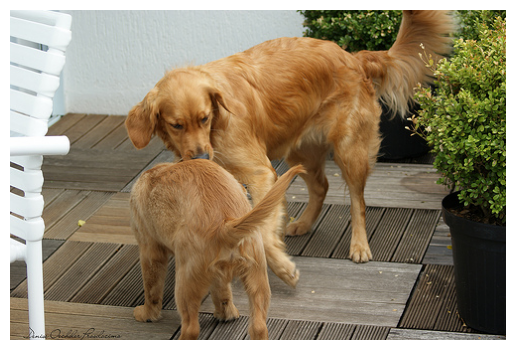

_____________________________________________________________________________


Название файла    : 2689001252_e0016c89f0.jpg
Реальный возраст  : A brown dog leaps into the air next to a black dog on a sandy bay .
Размер изображения: (352, 500, 3)


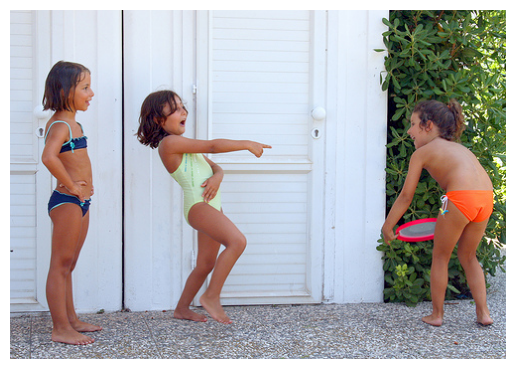

_____________________________________________________________________________


Название файла    : 2393264648_a280744f97.jpg
Реальный возраст  : A woman looking at view of a city .
Размер изображения: (187, 500, 3)


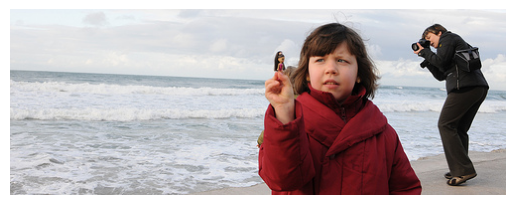

_____________________________________________________________________________


Название файла    : 172097782_f0844ec317.jpg
Реальный возраст  : A man with a wake-board is diving over a surface that is not water .
Размер изображения: (500, 337, 3)


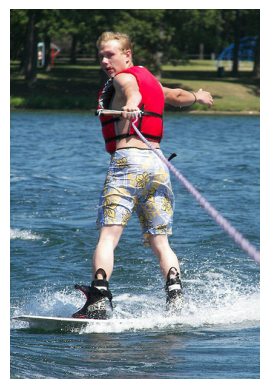

_____________________________________________________________________________


Название файла    : 2991575785_bd4868e215.jpg
Реальный возраст  : A man is standing on his hands on a sidewalk while others watch .
Размер изображения: (333, 500, 3)


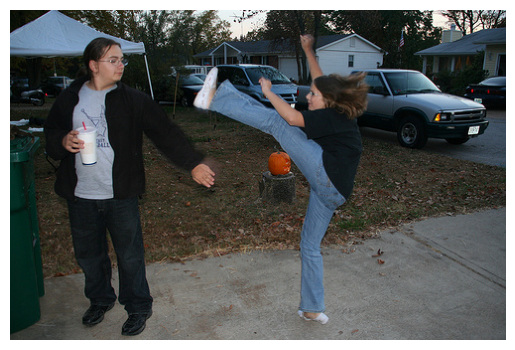

_____________________________________________________________________________


Название файла    : 246055693_ccb69ac5c6.jpg
Реальный возраст  : A white dog and brown dog fighting .
Размер изображения: (356, 500, 3)


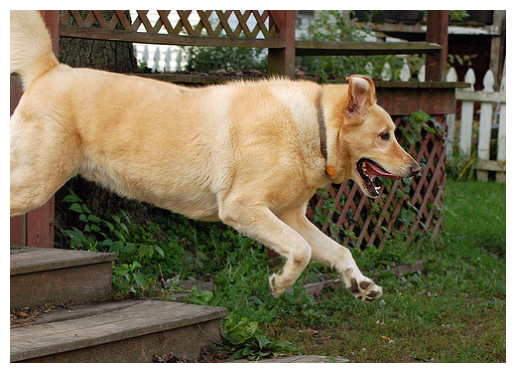

_____________________________________________________________________________


Название файла    : 799486353_f665d7b0f0.jpg
Реальный возраст  : a old man walks down the uncrowded road .
Размер изображения: (500, 333, 3)


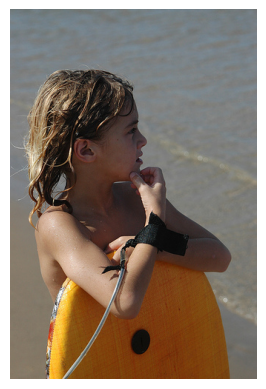

_____________________________________________________________________________


In [7]:
# отображаю количество уникальных файлов в тренировочном датасете
print(color.BOLD + color.BLUE + '\nКоличество изображений в тренировочном датасете: ' + color.END + str(len(df_train_dataset['image'].unique())))

# вывожу на экран 7 произвольных изображений
for pic in sorted(random.sample(range(0, df_train_dataset.shape[0]), 7)):

    file_addr = dataset_path + 'train_images/'+ str(df_train_dataset.loc[pic, "image"])
    image = Image.open(file_addr)
    img_arr = np.array(image)

    print('\n')
    print(f'Название файла    : {df_train_dataset.loc[pic, "image"]}')
    print(f'Реальный возраст  : {df_train_dataset.loc[pic, "query_text"]}')
    print(f'Размер изображения: {str(img_arr.shape)}')

    plt.imshow(img_arr)
    plt.axis('off')
    plt.show()
    print(color.BOLD + color.BLUE + '_'*77 + color.END)

Выведем на экран изображения из тестового датасета.


Количество изображений в тестовом датасете: 100


Название файла    : 1429546659_44cb09cbe2.jpg
Реальный возраст  : A white dog with a stick in his mouth standing next to a black dog .
Размер изображения: (334, 500, 3)


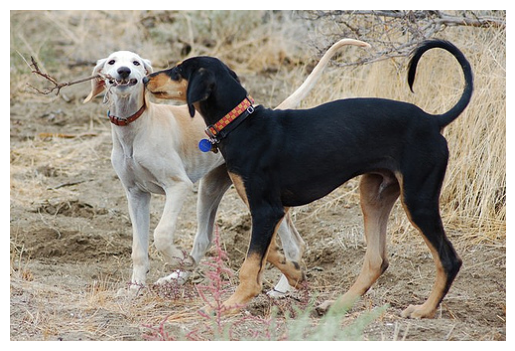

_____________________________________________________________________________


Название файла    : 1745110280_0cbff5e273.jpg
Реальный возраст  : The brown dog is wearing a black collar .
Размер изображения: (500, 307, 3)


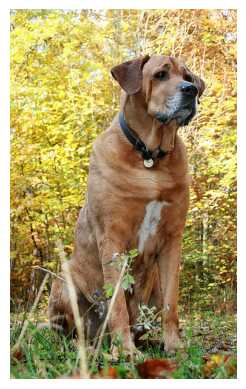

_____________________________________________________________________________


Название файла    : 191003283_992257f835.jpg
Реальный возраст  : A toddler boy in a red tank top and khaki shorts walks on the European street with a woman in a white top and faded blue jeans .
Размер изображения: (375, 500, 3)


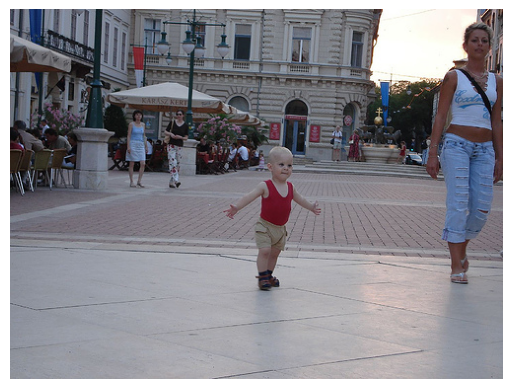

_____________________________________________________________________________


Название файла    : 345785626_9fa59f38ce.jpg
Реальный возраст  : A young man sits on a cliff , watching the ocean .
Размер изображения: (500, 375, 3)


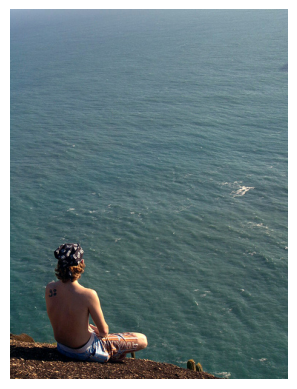

_____________________________________________________________________________


Название файла    : 3466891862_9afde75568.jpg
Реальный возраст  : The small dog returns with his stick proudly .
Размер изображения: (333, 500, 3)


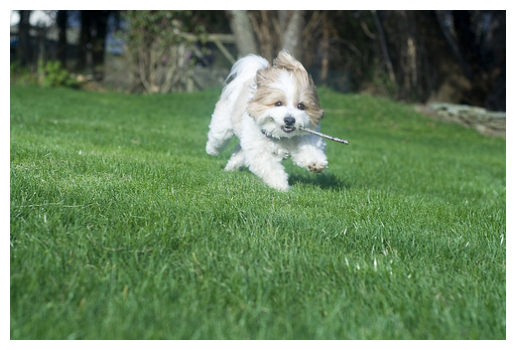

_____________________________________________________________________________


Название файла    : 3553476195_fb3747d7c1.jpg
Реальный возраст  : Two black dogs fighting over an orange toy .
Размер изображения: (250, 500, 3)


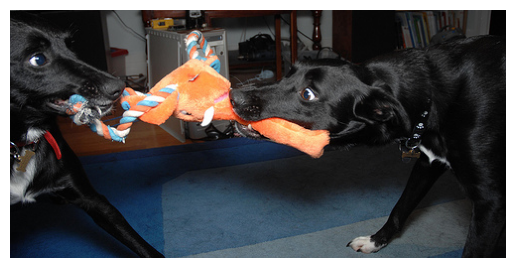

_____________________________________________________________________________


Название файла    : 381514859_b40418d9c3.jpg
Реальный возраст  : Two small white dogs chasing after a red ball .
Размер изображения: (333, 500, 3)


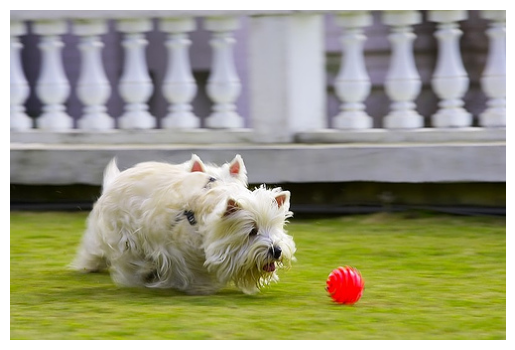

_____________________________________________________________________________


In [8]:
# отображаю количество уникальных файлов в тестовом датасете
print(color.BOLD + color.BLUE + '\nКоличество изображений в тестовом датасете: ' + color.END + str(len(df_test_images['image'].unique())))

# вывожу на экран 7 произвольных изображений
for pic in sorted(random.sample(range(0, df_test_queries.shape[0]), 7)):

    file_addr = dataset_path + 'test_images/'+ str(df_test_queries.loc[pic, "image"])
    image = Image.open(file_addr)
    img_arr = np.array(image)

    print('\n')
    print(f'Название файла    : {df_test_queries.loc[pic, "image"]}')
    print(f'Реальный возраст  : {df_test_queries.loc[pic, "query_text"]}')
    print(f'Размер изображения: {str(img_arr.shape)}')

    plt.imshow(img_arr)
    plt.axis('off')
    plt.show()
    print(color.BOLD + color.BLUE + '_'*77 + color.END)

Выведенные изображения представляют собой jpg файлы разного размера. Фотографии имеют различную композицию и яркость.
 - тренировочный датасет состоит из 1000 уникальных изображений;
 - тестовый датасет содержит 100 уникальных изображений.

## 2. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

### Пропуски, Типы, Дубликаты

Исследуем данные на наличие пропусков.

In [9]:
# вывожу на экран количество пропусков
for df in df_tuple:
    print(f'Количество пропусков в датафрейме "{df.columns.name}": {df.isna().sum().sum()}')

Количество пропусков в датафрейме "df_train_dataset": 0
Количество пропусков в датафрейме "df_crowd_annotations": 0
Количество пропусков в датафрейме "df_expert_annotations": 0
Количество пропусков в датафрейме "df_test_images": 0
Количество пропусков в датафрейме "df_test_queries": 0


Пропуски отсутствуют.

Рассмотрим типизацию столбцов.

In [10]:
# вывожу на экран количество пропусков
for df in df_tuple:
    print(color.BLUE + color.BOLD + f'Типы данных в датафрейме "{df.columns.name}":\n' + color.END)
    print(df.dtypes)
    print('=' * 105, end='\n' * 3)

Типы данных в датафрейме "df_train_dataset":

df_train_dataset
image         object
query_id      object
query_text    object
dtype: object


Типы данных в датафрейме "df_crowd_annotations":

df_crowd_annotations
image        object
query_id     object
pos_part    float64
positive      int64
negative      int64
dtype: object


Типы данных в датафрейме "df_expert_annotations":

df_expert_annotations
image         object
query_id      object
first_exp      int64
second_exp     int64
third_exp      int64
dtype: object


Типы данных в датафрейме "df_test_images":

df_test_images
image    object
dtype: object


Типы данных в датафрейме "df_test_queries":

df_test_queries
query_id      object
query_text    object
image         object
dtype: object




Типизация выполнена верно.

Проанализируем датафреймы на наличие явных дубликатов.

In [11]:
# вывожу на экран количество явных дубликатов
for df in df_tuple:
    print(f'Количество явных дубликатов в датафрейме "{df.columns.name}": {df.duplicated().sum()}')

Количество явных дубликатов в датафрейме "df_train_dataset": 0
Количество явных дубликатов в датафрейме "df_crowd_annotations": 0
Количество явных дубликатов в датафрейме "df_expert_annotations": 0
Количество явных дубликатов в датафрейме "df_test_images": 0
Количество явных дубликатов в датафрейме "df_test_queries": 0


Явных дубликатов не обнаружено.

### Преобразование признаков

Для дальнейшего анализа признака, преобразуем значение доли людей, подтвердивших, что описание соответствует изображению и округлим его до 2 знаков после запятой.

In [12]:
# выполняю преобразование значений
df_crowd_annotations['pos_part'] = df_crowd_annotations['pos_part'].apply(lambda x: round(x, 2))

# вывожу 5 произвольных значений доли, при этом не равной 0
display(df_crowd_annotations.query('pos_part != 0.00')['pos_part'].sample(5))

5031    0.330
22435   0.330
24251   0.670
24405   0.330
34282   0.330
Name: pos_part, dtype: float64

Преобразование успешно выполнено.

### Индивидуальный анализ признаков

Осуществим индивидуальный анализ признаков датафреймов.

- анализ колонки `pos_part` датафрейма df_crowd_annotations


Описание столбца (числовой дискретный, type: float64):


,Значения
Количество,"47,830.000"
Пропуски,0.000
Уникальных,12.000
Среднее арифметическое,0.069
Стандартное отклонение,0.208
Минимум,0.000
25%,0.000
50% (медиана),0.000
75%,0.000
Максимум,1.000



Доля уникальных значений (max 15 кат.)


,pos_part,proportion
0,0.000,0.877
1,0.330,0.063
2,0.670,0.028
3,1.000,0.028
4,0.250,0.002
5,0.500,0.001
6,0.200,0.000
7,0.750,0.000
8,0.600,0.000
9,0.400,0.000


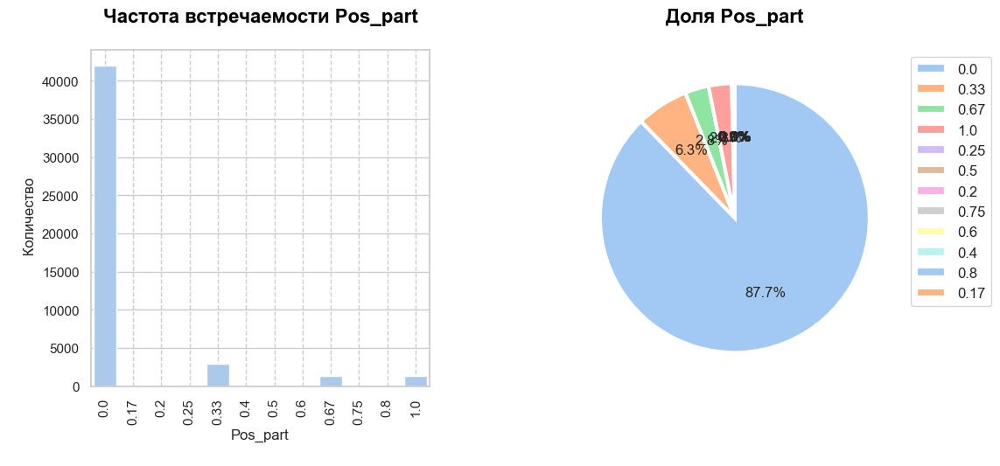

In [13]:
# применяю функцию для признака датасета 
describe_data(df_crowd_annotations, 'pos_part')

- анализ колонки `positive` датафрейма df_crowd_annotations


Описание столбца (числовой дискретный, type: int64):


,Значения
Количество,"47,830.000"
Пропуски,0.000
Уникальных,6.000
Среднее арифметическое,0.208
Стандартное отклонение,0.629
Минимум,0.000
25%,0.000
50% (медиана),0.000
75%,0.000
Максимум,5.000



Доля уникальных значений (max 15 кат.)


,positive,proportion
0,0,0.877
1,1,0.065
2,2,0.029
3,3,0.028
4,4,0.000
5,5,0.000


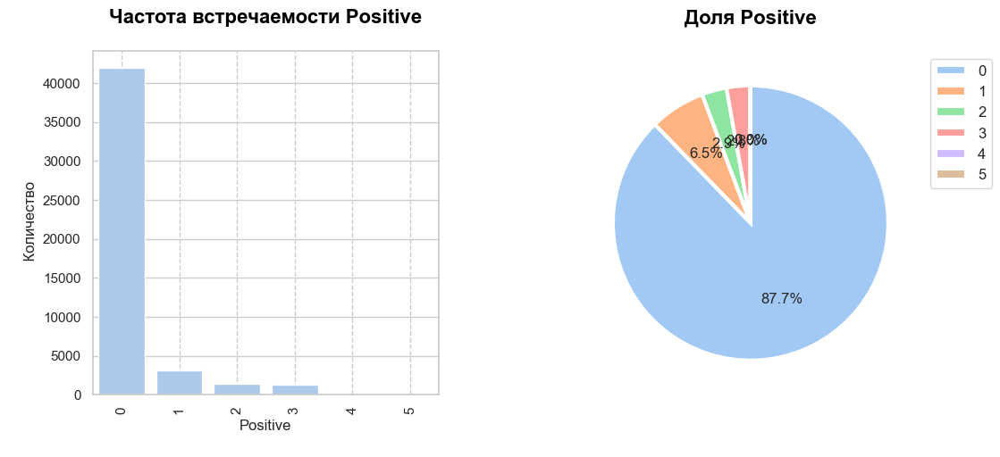

In [14]:
# применяю функцию для признака датасета 
describe_data(df_crowd_annotations, 'positive')

- анализ колонки `negative` датафрейма df_crowd_annotations


Описание столбца (числовой дискретный, type: int64):


,Значения
Количество,"47,830.000"
Пропуски,0.000
Уникальных,7.000
Среднее арифметическое,2.820
Стандартное отклонение,0.657
Минимум,0.000
25%,3.000
50% (медиана),3.000
75%,3.000
Максимум,6.000



Доля уникальных значений (max 15 кат.)


,negative,proportion
0,3,0.862
1,2,0.063
2,1,0.029
3,0,0.028
4,4,0.014
5,5,0.004
6,6,0.001


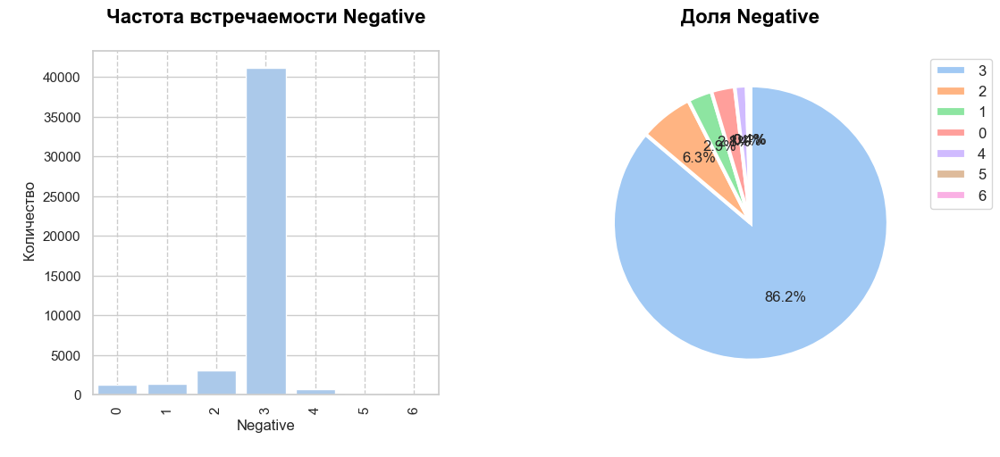

In [15]:
# применяю функцию для признака датасета 
describe_data(df_crowd_annotations, 'negative')


Описание столбца (числовой дискретный, type: int64):


,Значения
Количество,"5,822.000"
Пропуски,0.000
Уникальных,4.000
Среднее арифметическое,1.437
Стандартное отклонение,0.787
Минимум,1.000
25%,1.000
50% (медиана),1.000
75%,2.000
Максимум,4.000



Доля уникальных значений (max 15 кат.)


,first_exp,proportion
0,1,0.708
1,2,0.190
2,3,0.059
3,4,0.042


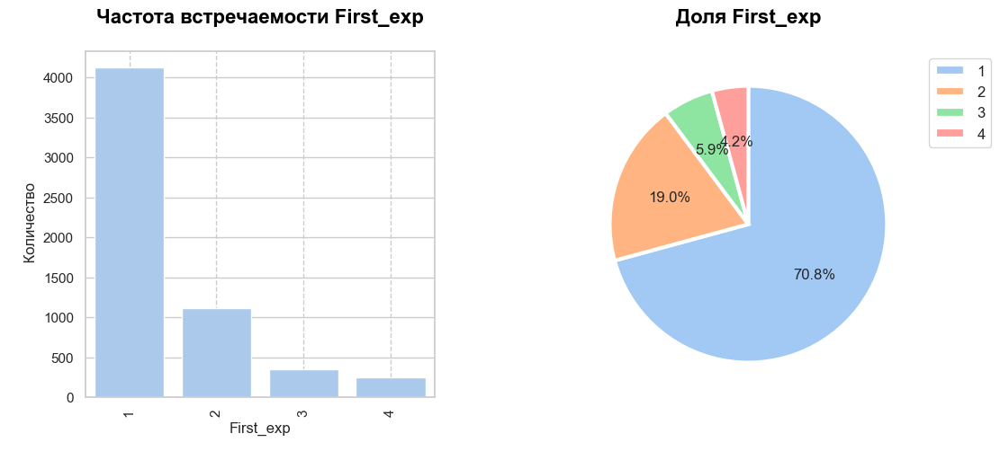

In [16]:
# применяю функцию для признака датасета 
describe_data(df_expert_annotations, 'first_exp')


Описание столбца (числовой дискретный, type: int64):


,Значения
Количество,"5,822.000"
Пропуски,0.000
Уникальных,4.000
Среднее арифметическое,1.624
Стандартное отклонение,0.856
Минимум,1.000
25%,1.000
50% (медиана),1.000
75%,2.000
Максимум,4.000



Доля уникальных значений (max 15 кат.)


,second_exp,proportion
0,1,0.571
1,2,0.286
2,3,0.089
3,4,0.053


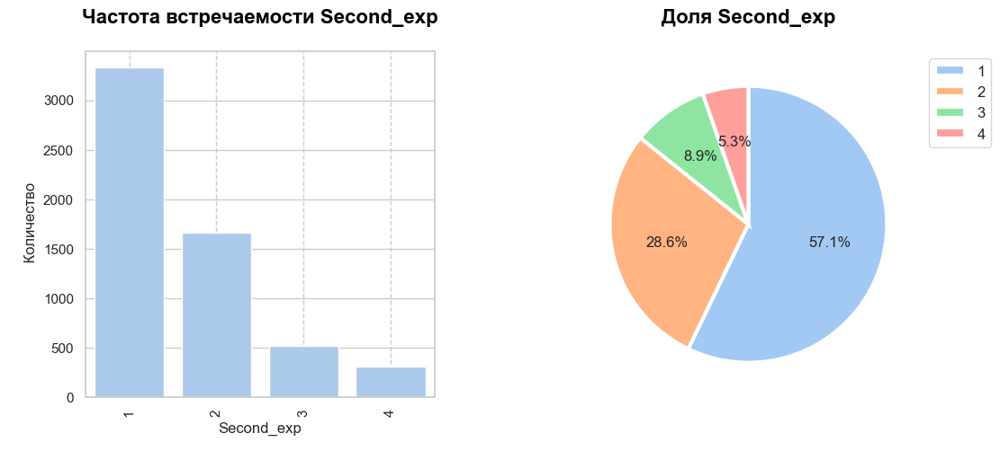

In [17]:
# применяю функцию для признака датасета 
describe_data(df_expert_annotations, 'second_exp')


Описание столбца (числовой дискретный, type: int64):


,Значения
Количество,"5,822.000"
Пропуски,0.000
Уникальных,4.000
Среднее арифметическое,1.882
Стандартное отклонение,0.904
Минимум,1.000
25%,1.000
50% (медиана),2.000
75%,2.000
Максимум,4.000



Доля уникальных значений (max 15 кат.)


,third_exp,proportion
0,1,0.404
1,2,0.382
2,3,0.144
3,4,0.071


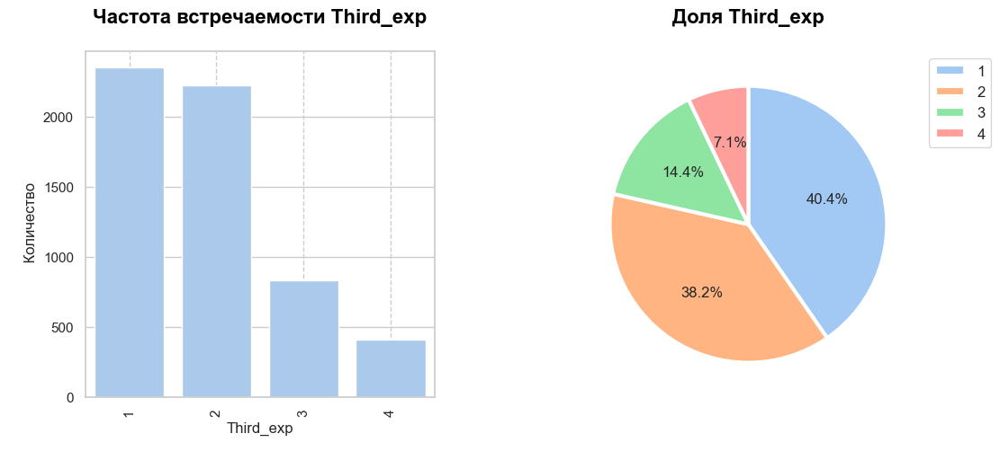

In [18]:
# применяю функцию для признака датасета 
describe_data(df_expert_annotations, 'third_exp')

**Промежуточный вывод по анализу признаков:**
- почти 88% людей, считают, что изображение и описание не подходят друг другу;
- в опросах людей чаще всего опрашивали 3 человека, что совпадает с количеством оценок экспертов;
- первый эксперт давал негативную оценку (1 и 2 балла) схожести картинки и описания в 90% случаев;
- эксперт №2 также фиксировал отсутствие схожести в 86% случаев;
- третий эксперт оставлял более позитивную оценку и 21% изображений и описаний были подходящими (3 и 4 балла).

### Расчёт оценки схожести изображения и описания

Для начала рассчитаем консолидированную оценку экспертов.<br>
Применим следующую логику:
- если поставлен 1 балл, то это значит нулевую схожесть или 0%;
- если дано 2 балла, то будем считать, что картинка и описание схожи на 25%;
- 3 балла от эксперта будет означать 75% схожести;
- 4 балла - точное описание к картинке или 100%.

Таким образом мы преобразуем оценки экспертов в вероятность того, что описание подходит картинке, которое лежит в диапазоне от 0 до 1. А далее посчитаем среднее арифметическое "вероятностей" и округлим значения до 2 знаков после запятой.

Создадим соответствующие функции для расчёта схожести картинки по мнению экспертов.

In [19]:
# создаю функцию преобразования баллов в "вероятность"
def transform_score(value):
  if value == 1:
    return 0
  elif value == 2:
    return 0.25
  elif value == 3:
    return 0.75
  else:
    return 1

# создаю функцию расчёта округлённого до 2 знаков среднего арифметического
def resulting_mark(row):
  return round(
        (
            transform_score(row['first_exp']) +
            transform_score(row['second_exp']) +
            transform_score(row['third_exp']) ) /
            3,
        2
      )

# применяю функцию и создаю новуй столбец в датафрейме df_expert_annotations
df_expert_annotations['exp_score'] = df_expert_annotations.progress_apply(resulting_mark, axis=1)

# валидирую результат
display(df_expert_annotations.sample(5))

# вывожу на экран распределение значений результирующей оценки экспертов
print(color.BOLD + color.BLUE + '\nРаспределение значений результирующей оценки экспертов:' + color.END)
display(df_expert_annotations['exp_score'].value_counts().reset_index())

  0%|          | 0/5822 [00:00<?, ?it/s]

df_expert_annotations,image,query_id,first_exp,second_exp,third_exp,exp_score
974,2215136723_960edfea49.jpg,2813992915_f732cf8539.jpg#2,1,1,2,0.080
3188,315880837_90db309bab.jpg,3558370311_5734a15890.jpg#2,1,1,1,0.000
2283,2843695880_eeea6c67db.jpg,339350939_6643bfb270.jpg#2,1,1,2,0.080
3137,3143155555_32b6d24f34.jpg,398662202_97e5819b79.jpg#2,2,3,3,0.580
368,143688283_a96ded20f1.jpg,1554713437_61b64527dd.jpg#2,1,1,2,0.080



Распределение значений результирующей оценки экспертов:


,exp_score,count
0,0.000,2350
1,0.080,965
2,0.170,677
3,0.250,592
4,0.420,309
5,1.000,247
6,0.750,217
7,0.580,191
8,0.330,98
9,0.830,72


Далее объединим датафреймы с оценками экспертов и результатами опросов людей.<br>
Объединение проведём по столбцам `image` и `query_id`, способом "outer", чтобы сохранить записи из обоиз датафреймов.

In [20]:
# объединяю датафреймы
df_scores = pd.merge(df_expert_annotations, df_crowd_annotations, how='outer', on=['image', 'query_id'])

# вывожу общую информацию о новом датафрейме
df_scores.info()
print()

# вывожу 10 произвольных строк нового датарфейма
display(df_scores.sample(10))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   first_exp   5822 non-null   float64
 3   second_exp  5822 non-null   float64
 4   third_exp   5822 non-null   float64
 5   exp_score   5822 non-null   float64
 6   pos_part    47830 non-null  float64
 7   positive    47830 non-null  float64
 8   negative    47830 non-null  float64
dtypes: float64(7), object(2)
memory usage: 3.5+ MB



,image,query_id,first_exp,second_exp,third_exp,exp_score,pos_part,positive,negative
45628,422763475_0bc814dac6.jpg,293879742_5fe0ffd894.jpg#2,1.000,2.000,2.000,0.170,NaN,NaN,NaN
13709,2495931537_9b8d4474b6.jpg,2707873672_15e6b5d54b.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000
34942,339350939_6643bfb270.jpg,2663794355_e726ec7e05.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000
22719,2938747424_64e64784f0.jpg,3482974845_db4f16befa.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000
4305,166507476_9be5b9852a.jpg,3347666612_659e6e2207.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000
11532,241346971_c100650320.jpg,1174629344_a2e1a2bdbf.jpg#2,1.000,1.000,1.000,0.000,NaN,NaN,NaN
10498,2346401538_f5e8da66fc.jpg,3121521593_18f0ec14f7.jpg#2,2.000,2.000,3.000,0.420,0.000,0.000,3.000
41899,3609032038_005c789f64.jpg,2480850054_de3433b54a.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000
38448,3504881781_6a842e043b.jpg,138718600_f430ebca17.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000
22702,2938747424_64e64784f0.jpg,3040033126_9f4b88261b.jpg#2,2.000,3.000,4.000,0.670,0.330,1.000,2.000


Общая информация и вывод произвольных строк датафрейма показали, что появлиилсь пропуски в значениях в виду отсутствия пересечения множеств ключевых значений в двух датафреймах. Для определения финальной оценки каждой комбинации картинки и её описания воспользуемся следующей логикой:
- если нет оценки людей, то возьмём оценку экспертов (оценка экспертов в приоритете);
- если нет оценки эскпертов, то возьмём оценку людей;
- если есть оба значения, то рассчитаем финальную оценку как их сумму с весами 75% к 25% для оценки эскпертов и людей соответственно.

In [21]:
# создаю функцию для расчёта общей финальной оценки описания
def calc_score(row):
  if np.isnan(row['pos_part']):
    return row['exp_score']
  elif np.isnan(row['exp_score']):
    return row['pos_part']
  else:
    return row['exp_score'] * 0.75 + row['pos_part'] * 0.25

# применяю функцию и создаю новую колонку "final_score"
df_scores['final_score'] = df_scores.progress_apply(calc_score, axis=1)

# валидирую результат
display(df_scores.sample(10))

  0%|          | 0/51323 [00:00<?, ?it/s]

,image,query_id,first_exp,second_exp,third_exp,exp_score,pos_part,positive,negative,final_score
11471,241346508_0b3907a95b.jpg,241345905_5826a72da1.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000,0.000
14613,2533424347_cf2f84872b.jpg,3578841731_f775cab089.jpg#2,NaN,NaN,NaN,NaN,0.330,1.000,2.000,0.330
46939,480505313_2dc686e5db.jpg,224369028_b1ac40d1fa.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000,0.000
37812,3485425825_c2f3446e73.jpg,363617160_6cb0c723be.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000,0.000
48476,525863257_053333e612.jpg,525863257_053333e612.jpg#2,NaN,NaN,NaN,NaN,1.000,3.000,0.000,1.000
9812,2301525531_edde12d673.jpg,2470486377_c3a39ccb7b.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000,0.000
3838,154871781_ae77696b77.jpg,2890113532_ab2003d74e.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000,0.000
136,1082379191_ec1e53f996.jpg,3143155555_32b6d24f34.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000,0.000
17107,2648165716_02e2e74fd6.jpg,700884207_d3ec546494.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000,0.000
26945,3121521593_18f0ec14f7.jpg,3139160252_75109e9e05.jpg#2,NaN,NaN,NaN,NaN,0.000,0.000,3.000,0.000


Финальная оценка рассчитана.<br>
Удалим ненужные колонки и проверим датафрейм на пропуски и дубликаты.

In [22]:
# оставляем релевантные колонки
df_scores = df_scores[['image',	'query_id', 'final_score']]

# проверяем на пропуски и дубликаты
print(color.BOLD + color.BLUE + 'Пропуски: ' + color.END + str(df_scores.isna().sum().sum()))
print(color.BOLD + color.BLUE + 'Дубликаты: ' + color.END + str(df_scores.duplicated().sum()))

# валидирую результат (исключаю нулевые значения)
display(df_scores.query('final_score != 0').sample(10))

Пропуски: 0
Дубликаты: 0


,image,query_id,final_score
9404,2280525192_81911f2b00.jpg,327415627_6313d32a64.jpg#2,0.562
31599,3258874419_23fec1bdc1.jpg,3467219837_7d62213dec.jpg#2,0.670
21750,2902269566_419d9f1d8e.jpg,3323988406_e3c8fce690.jpg#2,0.330
15958,2595186208_9b16fa0ee3.jpg,2926233397_71e617f3a3.jpg#2,0.188
8222,2207244634_1db1a1890b.jpg,3027397797_4f1d305ced.jpg#2,0.398
44785,384577800_fc325af410.jpg,2822290399_97c809d43b.jpg#2,0.270
38068,3498997518_c2b16f0a0e.jpg,2526041608_a9775ab8d7.jpg#2,0.940
13342,2479652566_8f9fac8af5.jpg,1096395242_fc69f0ae5a.jpg#2,0.250
15444,2575647360_f5de38c751.jpg,434792818_56375e203f.jpg#2,0.080
38792,3518126579_e70e0cbb2b.jpg,3701291852_373ea46bb6.jpg#2,0.188


Далее создадим новый датафрейм, в котором объединим данные из тренировочного датафрейма и финальные оценки.

In [23]:
# выполняю объединение
df_train = pd.merge(df_train_dataset, df_scores, how='outer', on=['image', 'query_id'])

# валидирую результат
display(df_train.sample(10))

# вывожу общую информацию о новом датафрейме
print()
df_train.info()

,image,query_id,query_text,final_score
18884,2739331794_4ae78f69a0.jpg,3741462565_cc35966b7a.jpg#2,A young girl dressed in pink with a hair barrette pursing her lips at a big chocolate milkshake .,0.000
38893,3521374954_37371b49a4.jpg,543007912_23fc735b99.jpg#2,NaN,0.000
19336,2782433864_5a0c311d87.jpg,3593392955_a4125087f6.jpg#2,NaN,0.000
24329,3017521547_f5ef8848e3.jpg,3061481868_d1e00b1f2e.jpg#2,NaN,0.000
21749,2902269566_419d9f1d8e.jpg,3317073508_7e13565c1b.jpg#2,NaN,0.000
11963,2431470169_0eeba7d602.jpg,1547883892_e29b3db42e.jpg#2,NaN,0.330
50389,766099402_cdda6964f0.jpg,3655074079_7df3812bc5.jpg#2,NaN,0.000
8978,2247889670_413db8094b.jpg,2460797929_66446c13db.jpg#2,NaN,0.000
1192,1267711451_e2a754b4f8.jpg,1764955991_5e53a28c87.jpg#2,NaN,0.000
4673,1765164972_92dac06fa9.jpg,2396691909_6b8c2f7c44.jpg#2,NaN,0.330



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        51323 non-null  object 
 1   query_id     51323 non-null  object 
 2   query_text   5822 non-null   object 
 3   final_score  51323 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


Заметим отсутствие описаний для большинства изображений. Исправим это, подгрузив описания из оригинального датафрейма.

In [24]:
# выполняю объединение для заполнения колонки 'query_text'
df_train = (
    df_train[['image', 'query_id', 'final_score']]
    .merge(df_train_dataset[['query_id', 'query_text']], on='query_id', how='left')
)

# оставляю релевантные колонки
df_train = df_train[['image', 'query_id', 'query_text', 'final_score']]

# очищаю датафрейм от дубликатов и пропусков
df_train = df_train.drop_duplicates().dropna().reset_index(drop=True)

# проверяю на пропуски и дубликаты
print(color.BOLD + color.BLUE + 'Пропуски: ' + color.END + str(df_train.isna().sum().sum()))
print(color.BOLD + color.BLUE + 'Дубликаты: ' + color.END + str(df_train.duplicated().sum()))

# валидирую результат
display(df_train.sample(10))

# вывожу общую информацию о новом датафрейме
print()
df_train.info()

Пропуски: 0
Дубликаты: 0


,image,query_id,query_text,final_score
31742,3287549827_04dec6fb6e.jpg,422763475_0bc814dac6.jpg#2,A child running with a snowboard on a snow covered surface .,0.188
42501,3685328542_ab999b83bb.jpg,311146855_0b65fdb169.jpg#2,A man and a woman wearing decorative costumes and dancing in a crowd of onlookers .,0.670
14983,256085101_2c2617c5d0.jpg,293881927_ac62900fd4.jpg#2,The dog is on the fence,0.000
37236,3498997518_c2b16f0a0e.jpg,241345844_69e1c22464.jpg#2,A football player is talking to his coach .,0.000
48475,566397227_a469e9e415.jpg,3004823335_9b82cbd8a7.jpg#2,"A dog in a grassy field , looking up .",0.128
32511,3332467180_d72f9b067d.jpg,463978865_c87c6ca84c.jpg#2,A man with dreadlocks and a backpack walks down the sidewalk with colorful buildings in the background .,0.000
8900,2248487950_c62d0c81a9.jpg,523985664_c866af4850.jpg#2,A girl wearing a swimsuit top wears a sign to give free hugs .,0.000
45306,448658518_eec0b648a6.jpg,2595186208_9b16fa0ee3.jpg#2,A black dog jumping off of a dock .,0.000
45095,444057017_f1e0fcaef7.jpg,1348304997_afe60a61df.jpg#2,A young girl jumping over a railing or a ladder on its side .,0.000
39809,3582742297_1daa29968e.jpg,3429956016_3c7e3096c2.jpg#2,A man climbs up a sheer wall of ice .,0.000



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50214 entries, 0 to 50213
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        50214 non-null  object 
 1   query_id     50214 non-null  object 
 2   query_text   50214 non-null  object 
 3   final_score  50214 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.5+ MB


**Промежуточные выводы по шагу 2:**
- пропуски отсутствуют;
- типизация выполнена верно;
- явных дубликатов не обнаружено;
- выполнено преобразование значений доли людей, подтвердивших, что описание соответствует изображению: выражено в % и округлено до 2 знаков после запятой;
- почти 88% людей, считают, что изображение и описание не подходят друг другу;
- в опросах людей чаще всего опрашивали 3 человека, что совпадает с количеством оценок экспертов;
- первый эксперт давал негативную оценку (1 и 2 балла) схожести картинки и описания в 90% случаев;
- эксперт №2 также фиксировал отсутствие схожести в 86% случаев;
- третий эксперт оставлял более позитивную оценку, и 21% изображений и описаний были подходящими (3 и 4 балла);
- выполнили расчёт финальной оценки схожести картинки с описанием, учитывая мнение экспертов и опроса людей;
- подготовили тренировочный датафрейм.

## 3. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Сформируем список слов, относящихся к запрещённым к упоминанию.

In [25]:
# создаю список запрещённых к упоминанию слов
law_stop_words = [
  'child', 'children', 'kid', 'youth', 'minor', 'teenage', 'teenager',
  'adolescent', 'toddler', 'schoolchild', 'schoolchildren', 'baby', 'boy', 'girl',
  'student', 'sprout', 'twerp', 'brat', 'teen', 'youngster', 'dudette'
]

Далее создадим функцию, которая позволит токенизировать текст и найти описания содержащие запрещённые слова.

In [26]:
# инициализирую лемматизатор
wnl = WordNetLemmatizer()

# функция для добавления частеречного тега в лемматизаторе
def get_wordnet_pos(word):

    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

# объявляю функцию
def lemmatize_check(text):
    '''
    Функция для обработки и лемматизации входных текстовых данных.
    Она позволяет привести текст к нижнему регистру, оставить латинские символы и символ "~".
    Далее провести лемматизацию английского текста, учитывая части речи.
    Затем ведёт поиск по списку запретных слов и выводит 1, если запретные слова найдены.

    Принимает на вход текст.
    Пример:
        my_string = 'Several words to be cleared and lemmatized!'
        lemmatize_check(my_string)
    '''

    # привожу текст к нижнему регистру
    text = text.lower()

    # оставляю латинские символы помощью регулярных выражений
    text = re.sub(r'[^a-zA-Z]', ' ', text)
    text = text.split()
    text = ' '.join(text)

    # токенизирую текст и лемматизирую
    tokens = word_tokenize(text, language='english')
    lemmatized_tokens = [wnl.lemmatize(word, get_wordnet_pos(word)) for word in tokens]
    
    # веду поиск запретных слов
    if [w for w in lemmatized_tokens if w in law_stop_words]:
        return 1
    else:
        return 0

Применим функцию для формирования нового признака со значением 1, если описание следует исключить, либо 0 - оставить.<br>
Также выведем на экран пример описаний, которые рекомендуется исключить.

In [27]:
# провожу обработку текста и формирование нового признака
# применяю функцию progress_apply для отслеживания прогресса выполнения процесса
df_train['exclude'] = df_train['query_text'].progress_apply(lemmatize_check)

# валидирую результат
df_train.head(5)

# вывожу на экран пример описаний к исключению
print(color.BOLD + color.BLUE + '\nПримеры описаний к исключению:' + color.END)
df_train.query('exclude == 1')['query_text'].head(10)

  0%|          | 0/50214 [00:00<?, ?it/s]


Примеры описаний к исключению:


1                                                                              A boy in glasses is wearing a red shirt .
2                                                                       A young boy holds onto a blue handle on a pier .
10                                                                A little girl wearing a pink shirt jumps off a swing .
11                                                                                    a young girl wearing blue smiles .
12                                              A young child is wearing blue goggles and sitting in a float in a pool .
13                                           A young boy wearing a blue and red hat is using a camera near a swing set .
14    A smiling boy in an orange shirt with a safari hat sits at the playground , while a boy in a blue shirt looks on .
18                                          A girls in a blue shirt holds a flower while sitting on a man 's shoulders .
19                              

Исключим объекты, содержащие запретные к упоминанию слова в описаниях к изображениям.

In [28]:
# исключаю объекты с запретными словами
df_train = df_train.query('exclude == 0')

# удаляю признак `exclude`
df_train = df_train.drop('exclude', axis=1).reset_index(drop=True)

# валидирую результат
df_train.sample(5)

# вывожу общую информацию о датафрейме
print()
df_train.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35771 entries, 0 to 35770
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        35771 non-null  object 
 1   query_id     35771 non-null  object 
 2   query_text   35771 non-null  object 
 3   final_score  35771 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.1+ MB


Датафрейм подготовлен.<br>
Сохраним его в csv файл для дальнейшей загрузки при необходимости.

In [29]:
# сохраняю датафрейм в CSV-файл
df_train.to_csv('df_train_copy.csv', index=False)

## 4. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

Создадим функции, которые выполня загрузку и преобразования изображений из тренировочных и тестовых датасетов.

In [30]:
# созадю загрузчик для ТРЕНИРОВОЧНОЙ выборки
def load_train():

    train_datagen = ImageDataGenerator(
        rescale=1./255,
        # validation_split=TEST_SIZE,
        # vertical_flip=True,
        # horizontal_flip=True,
        # width_shift_range=0.10,
        # height_shift_range=0.10,
        # rotation_range=90,
        # brightness_range=[0.70, 1.30],
        # zoom_range=0.30
    )

    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df_train,
        directory=dataset_path + 'train_images/',
        x_col='image',
        y_col='final_score',
        target_size=(224, 224),
        batch_size=32,
        class_mode='input',
        seed=RANDOM_STATE
    )

    return train_gen_flow


# созадю загрузчик для ТЕСТОВОЙ выборки
def load_test():

    test_datagen = ImageDataGenerator(
        rescale=1./255,
        # validation_split=TEST_SIZE,
        # vertical_flip=True,
        # horizontal_flip=True,
        # width_shift_range=0.10,
        # height_shift_range=0.10,
        # rotation_range=90,
        # brightness_range=[0.70, 1.30],
        # zoom_range=0.30
    )

    test_gen_flow = test_datagen.flow_from_dataframe(
        dataframe=df_test_images,
        directory=dataset_path + 'test_images/',
        x_col='image',
        y_col=None,
        target_size=(224, 224),
        batch_size=32,
        class_mode='input',
        seed=RANDOM_STATE
    )

    return test_gen_flow

Подготовим функцию, которая с помощью модели ResNet50 векторизует изображения.

In [31]:
# создаю функцию для векторизации изображений
def emdb_model():

    backbone = ResNet50(
        input_shape=(224, 224, 3),
        weights='imagenet',
        include_top=False
    )

    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())

    # optimizer = Adam(learning_rate=0.001)
    model.compile(
        # optimizer=optimizer,
        # loss='mean_squared_error', 
        # metrics=['mae']
    )

    return model

Получим эмбеддинги тренировочных и тестовых картинок.

In [ ]:
%%time

# для ускорения работы над проектом использую "флаг"
# загрузки ранее подготовленных векторов из файла
if use_prepared_files == 1:
    
    # загружаю данные из ранее подготовленных файлов
    train_img_embd = np.load('df_train_img_embd.npy')
    test_img_embd = np.load('df_test_img_embd.npy')

else:

    # создаю функцию для векторизации изображений
    def get_img_embd(model, input_images):
        return model.predict(input_images)

    # применяю функцию к тренировочному датасету
    train_img_embd = get_img_embd(emdb_model(), load_train())
    print(f'\nРазмер эмбеддингов тренировочных изображений: {train_img_embd.shape}\n')

    # применяю функцию к тестовому датасету
    test_img_embd = get_img_embd(emdb_model(), load_test()) 
    print(f'\nРазмер эмбеддингов тестовых изображений: {test_img_embd.shape}\n')

    # сохраняю датафреймы в файл
    # np.savetxt('df_train_img_embd.txt', train_img_embd, delimiter=',', encoding=None)
    # np.savetxt('df_test_img_embd.txt', test_img_embd, delimiter=',', encoding=None)
    np.save('df_train_img_embd', train_img_embd)
    np.save('df_test_img_embd', test_img_embd)
    print()

Found 35771 validated image filenames.


c:\Users\Evgeniy\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1118/1118 ━━━━━━━━━━━━━━━━━━━━ 530s 473ms/step

Размер эмбеддингов тренировочных изображений: (35771, 2048)

Found 100 validated image filenames.
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 755ms/step

Размер эмбеддингов тестовых изображений: (100, 2048)


CPU times: total: 13min 11s
Wall time: 8min 56s


Векторизация изображений выполнена.

## 5. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


Выполним векторизацию текста с помощью токенизатора и предобученной модели BERT.<br>
Подготовим эмбеддинги сразу для тренировочного и тестового датафреймов.

In [ ]:
%%time

# для ускорения работы над проектом использую "флаг"
# загрузки ранее подготовленных векторов из файла
if use_prepared_files == 1:
    
    # загружаю данные из ранее подготовленных файлов
    train_txt_embd = np.load('df_train_txt_embd.npy')
    test_txt_embd = np.load('df_test_txt_embd.npy')

else:

    # загружаю предобученный токенизатор и модель BERT
    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
    model = BertModel.from_pretrained('bert-base-uncased', return_dict=True)

    # создаю списки текстовых значений из тренировочного и тестового датафреймов
    train_text = list(df_train['query_text'])
    test_text = list(df_test_queries['query_text'])

    # создаю пустые списки для хранения результирующих векторов
    train_txt_embd = []
    test_txt_embd = []


    # ТРЕНИРОВОЧНЫЕ ДАННЫЕ

    # задаю размер батча
    batch_size = 1000

    # прогоняю в цикле список разделённый на батчи
    for i in tqdm(range(0, len(train_text), batch_size)):
        # формирую партию текстов
        batch_texts = train_text[i : i + batch_size]
        
        # токенизирую текущую партию текстов
        input_ids = tokenizer(
            batch_texts, 
            padding=True, 
            truncation=True, 
            return_tensors="pt"
        ).to(model.device)
        
        # получаю выходные данные модели BERT
        with torch.no_grad():
            outputs = model(**input_ids)
            
        # беру скрытые состояния последнего слоя для каждого токена
        last_hidden_states = outputs.last_hidden_state
        
        # считаю среднее значение по каждому слову для получения одного вектора
        sentence_embeddings = last_hidden_states.mean(dim=1).cpu().numpy()
        
        # добавляю вектора для текущей партии в общий список 
        train_txt_embd.append(sentence_embeddings)

    # объединяю все полученные векторы в один большой массив
    train_txt_embd = np.vstack(train_txt_embd)


    # ТЕСТОВЫЕ ДАННЫЕ

    # токенизирую текст
    input_ids = tokenizer(
        test_text,
        padding=True, 
        truncation=True, 
        return_tensors="pt"
    ).to(model.device)

    # получаю выходные данные модели BERT
    with torch.no_grad():
        outputs = model(**input_ids)
        
    # беру скрытые состояния последнего слоя для каждого токена
    last_hidden_states = outputs.last_hidden_state

    # считаю среднее значение по каждому слову для получения одного вектора
    test_txt_embd = last_hidden_states.mean(dim=1).cpu().numpy()

    # вывожу на экран размеры результирующих эмбеддингов
    print(f'Размер эмбеддингов тренировочных запросов: {train_txt_embd.shape}')
    print(f'Размер эмбеддингов тестовых запросов: {test_txt_embd.shape}')

    # сохраняю датафреймы в файл
    # np.savetxt('df_train_txt_embd.txt', train_txt_embd, delimiter=',', encoding=None)
    # np.savetxt('df_test_txt_embd.txt', test_txt_embd, delimiter=',', encoding=None)
    np.save('df_train_txt_embd', train_txt_embd)
    np.save('df_test_txt_embd', test_txt_embd)
    print()

  0%|          | 0/36 [00:00<?, ?it/s]

Размер эмбеддингов тренировочных запросов: (35771, 768)
Размер эмбеддингов тестовых запросов: (500, 768)

CPU times: total: 52min 50s
Wall time: 7min 34s


Векторизация текстовых описаний выполнена.

## 6. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

Следующим шагом выполним объединение векторов изображений с векторами текстовых описаний из тренировочного датасета. Как было видно ранее, размерность количества объектов уже совпадает.

In [34]:
# выполняю объединение векторов
features = np.concatenate((train_img_embd, train_txt_embd), axis=1)

# вывожу размер входных данных
print(f'Размер эмбеддингов входных данных: {features.shape}')

Размер эмбеддингов входных данных: (35771, 2816)


Полученные вектора буду выступать в роли входных данных для моделей машинного обучения.<br>
Теперь создадим данные со значением целевого признака.

In [35]:
# готовлю массив целевого признака
target = np.array(df_train['final_score'])

# вывожу размер входных данных
print(f'Размер массива данных целевого признака: {target.shape}')

Размер массива данных целевого признака: (35771,)


Данные для моделей МО подготовлены, переходим к обучению.

## 7. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

Осуществим разбиение данных для обучения на тренировочную и валидационные выборки. Для этого используем класс GroupShuffleSplit.

In [ ]:
# инициализирую класс
gss = GroupShuffleSplit(
    n_splits=1,
    train_size=0.70,
    random_state=42
)

# получаю индексы
train_indices, val_indices = next(
    gss.split(
        X=features,
        y=target,
        groups=df_train['image']
    )
)

# выполняю разбиение данных согласно индексам
X_train, X_val = features[train_indices], features[val_indices]
y_train, y_val = target[train_indices], target[val_indices]

# вывожу на экран размер получившихся данных после подготовки
print(color.BLUE + color.BOLD + 'Размер подготовленных выборок:'+ color.END)
display(pd.DataFrame(
    data={
        'Входные признаки(X)': [X_train.shape, X_val.shape],
        'Целевой признак(y)': [y_train.shape, y_val.shape]
    }, 
    index=['Тренировочные данные', 'Валидационные данные']
))
print()

Размер подготовленных выборок:


,Входные признаки(X),Целевой признак(y)
Тренировочные данные,"(24880, 2816)","(24880,)"
Тестовые данные,"(10891, 2816)","(10891,)"


Разбиение выполнено.

В качестве метрики выберем RMSE, которую рассчитаем на кросс-валидации для тренировочной выборки. Выбор RMSE (корня среднеквадратичной ошибки) в качестве метрики обусловлен её простой интерпретируемостью (те же единицы измерения), чувствительностью к большим ошибкам, дифференцируемостью.

Для решения задачи регрессии воспользуемся 3мя моделями: линейная регрессия, градиентный бустинг и нейронные сети.

Выполним оценку метрики на модели линейной регрессией с регуляризацией L1 - Ridge().

In [44]:
%%time

# инициализирую модель
rdg = Ridge(
    alpha=2.5, 
    random_state=RANDOM_STATE
)

# рассчитываю метрику RMSE на кросс-валидации
cv_rdg = cross_val_score(
    rdg, 
    X_train, 
    y_train, 
    cv=3,
    n_jobs=-1,
    scoring='neg_root_mean_squared_error',
    error_score='raise'
)

# вывожу результат кросс-валидации на экран
print('\n' + f'Среднее арифметическое метрики на кросс-валидации: {abs(round(cv_rdg.mean(), 3))}')
print(f'Стандартное отклонение метрики на кросс-валидации: {round(cv_rdg.std(), 3)}\n')
print()


Среднее арифметическое метрики на кросс-валидации: 0.22
Стандартное отклонение метрики на кросс-валидации: 0.006


CPU times: total: 62.5 ms
Wall time: 3.21 s


Рассчитаем метрику на валидационных данных.

In [45]:
# обучаю модель
rdg.fit(X_train, y_train)

# выполняю предсказания
rdg_pred = rdg.predict(X_val)

# рассчитываю метрику RMSE
rdg_rmse = sqrt(mean_squared_error(y_val, rdg_pred))

# вывожу метрику на экран
print(f'RMSE для модели Ridge() на валидационных данных = {round(rdg_rmse, 5)}')

RMSE для модели Ridge() на валидационных данных = 0.21037


Далее выполним расчёт с помощью модели градиентного бустинга - CatBoostRegressor.<br>
Подбор гиперпараметров осуществим с помощью OptunaSearchCV.

In [39]:
%%time

# инициализирую модель
cbr = CatBoostRegressor(
    loss_function='RMSE',
    verbose=False, 
    random_seed=RANDOM_STATE
) 

# создаю список гиперпараметров
parameters = {
    'depth' : distributions.IntDistribution(5, 12, log=False, step=1),
    'iterations': distributions.IntDistribution(100, 500, log=False, step=100),
    'learning_rate' : distributions.FloatDistribution(0.02, 1, log=False, step=0.02)
}


# инициализирую OptunaSearchCV
oscv = OptunaSearchCV(
    cbr,
    parameters,
    scoring='neg_root_mean_squared_error',
    cv=3,
    n_trials=5,
    random_state=RANDOM_STATE,
    refit=True
)

# запускаю поиск гиперпараметров
oscv.fit(X_train, y_train)

# вывожу на экран название модели
print(
    color.BLUE + color.BOLD +
    f'Подбор гиперпараметров для модели CatBoost:'
    + color.END
)

# вывожу лучшие гиперпараметры
print(f'- лучшие гиперпараметры: {oscv.best_params_}')

# вывожу лучшую метрику RMSE на кросс-валидации
print(f'- метрика RMSE на кросс-валидации: {-1 * oscv.best_score_:.5f}')

<timed exec>:17: ExperimentalWarning: OptunaSearchCV is experimental (supported from v0.17.0). The interface can change in the future.
[I 2024-11-06 23:09:20,517] A new study created in memory with name: no-name-cc2398d3-589f-4242-a9d1-3ab403cee5b3
[I 2024-11-06 23:14:00,373] Trial 0 finished with value: -0.22061388202938967 and parameters: {'depth': 8, 'iterations': 500, 'learning_rate': 0.08}. Best is trial 0 with value: -0.22061388202938967.
[I 2024-11-06 23:15:34,961] Trial 1 finished with value: -0.22888682159980986 and parameters: {'depth': 7, 'iterations': 300, 'learning_rate': 0.30000000000000004}. Best is trial 0 with value: -0.22061388202938967.
[I 2024-11-06 23:15:55,261] Trial 2 finished with value: -0.21898564510542942 and parameters: {'depth': 6, 'iterations': 100, 'learning_rate': 0.18}. Best is trial 2 with value: -0.21898564510542942.
[I 2024-11-06 23:16:59,744] Trial 3 finished with value: -0.2671518767319965 and parameters: {'depth': 7, 'iterations': 200, 'learning_r

Подбор гиперпараметров для модели CatBoost:
- лучшие гиперпараметры: {'depth': 6, 'iterations': 100, 'learning_rate': 0.18}
- метрика RMSE на кросс-валидации: 0.21899
CPU times: total: 1h 20min 17s
Wall time: 11min 36s


Рассчитаем метрику на валидационных данных.

In [40]:
# 
cbr_pred = oscv.predict(X_val)

# рассчитываю метрику RMSE
cbr_rmse = sqrt(mean_squared_error(y_val, cbr_pred))

# вывожу метрику на экран
print(f'RMSE для модели CatBoostRegressor() на валидационных данных = {round(cbr_rmse, 5)}')

RMSE для модели CatBoostRegressor() на валидационных данных = 0.21087


Оценим метрику RMSE на кросс-вадидации с моделью полносвязной нейронной сети.

In [ ]:
%%time

# задаю кол-во нейронов на слоях сети
n_neurons = [torch.FloatTensor(X_train).size()[1], 512, 1]

# создаю пустой список для слоёв НС
net_layers = []

# циклом создаю слои НС
for i in range(1, len(n_neurons) - 1):
    # добавляю полносвязный слой
    net_layers.append(nn.Linear(n_neurons[i-1], n_neurons[i]))
    # добавляю Dropout 50%
    net_layers.append(nn.Dropout(p=0.5))
    if (i+1) % 2 == 0:
        # добавляю функцию активации для чётных слоёв
        net_layers.append(nn.ELU())
    else:
        # добавляю функцию активации для нечётных слоёв
        net_layers.append(nn.ReLU())

# добавляю выходной слой
net_layers.append(nn.Linear(n_neurons[-2], n_neurons[-1])) 

# задаю количество эпох
num_epochs = 500

# задаю скорость обучения
learning_rates = [0.0005, 0.003]

# создаю пустые списки для хранения результатов
fold_list = []
learning_rate_list = []
batch_list = []
epoch_list = []
rmse_list = []

# определяю стратифицированную стратегию кросс-валидации
# задаю количество фолдов
k = 3  
cv = KFold(n_splits=k, shuffle=True, random_state=RANDOM_STATE)

# выполняю кросс-валидацию
for fold, (train_index, test_index) in enumerate(cv.split(X_train, y_train)):
    
    print(color.BOLD + color.DARKCYAN + f'\nFold {fold + 1} of {k}' + color.END)
    
    # разделяю данные на тренировочные и тестовые для текущего фолда
    X_train_f, X_test_f = X_train[train_index, :], X_train[test_index, :]
    y_train_f, y_test_f = y_train[train_index], y_train[test_index]
    
    # создаю тензоры для фолда
    X_train_tn = torch.FloatTensor(X_train_f)
    X_test_tn = torch.FloatTensor(X_test_f)
    y_train_tn = torch.FloatTensor(y_train_f)
    y_test_tn = torch.FloatTensor(y_test_f)
    
    # задаю список для размера бэтча
    batch_size_list = np.arange(
        int(round(len(X_train_tn) / 4, -3)), # начальное значение
        int(len(X_train_tn) / 2), # конечное значение
        int(round(len(X_train_tn) / 4, -3)) # шаг
    )
    
    # инициализирую модель для текущего Fold
    # передаю элементы списка слоёв как параметры для инициализации НС
    net = nn.Sequential(*net_layers) 
    
    # задаю функцию потерь MSE для задачи регрессии
    loss = nn.MSELoss()
    
    # с помощью цикла перебираю шаг обучения
    for lera in learning_rates:
        
        # инициализирую оптимизатор Adam
        optimizer = torch.optim.Adam(net.parameters(), lr=lera, weight_decay=0.01)  
        
        # перебираю циклом размер бэтча
        for batch_size in batch_size_list:
    
            print(
                color.DARKCYAN + 
                f'  Выполняю расчёт для learning rate = {lera} и batch_size = {batch_size}...' + 
                color.END
            )
    
            # считаю количество разбиений на бэтчи
            num_batches = ceil(len(X_train_tn) / batch_size)

            # перебираю циклом эпохи обучения
            for epoch in range(num_epochs):

                # перемещиваю объекты в тренировочной выборке
                order = np.random.permutation(len(X_train_tn))

                # перебираю циклом разбиения на бэтчи
                for batch_idx in range(num_batches):

                    # нахожу объекты для текущего бэтча
                    start_index = batch_idx * batch_size
                    batch_indexes = order[start_index:start_index + batch_size]
                    X_batch = X_train_tn[batch_indexes]
                    y_batch = y_train_tn[batch_indexes]

                    # прямой проход
                    optimizer.zero_grad()
                    preds_train = net.forward(X_batch).flatten()
                    loss_value = loss(preds_train, y_batch)

                    # обратный проход
                    loss_value.backward()
                    optimizer.step()

                # выполняю оценку метрики
                if epoch == 0 or (epoch + 1) % 250 == 0:

                    # перевожу модель в режим предсказания и выполняю предсказание
                    net.eval()
                    preds_test = net.forward(X_test_tn)

                    # рассчитываю метрику RMSE
                    nn_rmse = sqrt(mean_squared_error(y_test_tn.detach().numpy(), preds_test.detach().numpy()))

                    # вывожу метрику на экран
                    print(f'    Эпоха {epoch + 1}, RMSE = {round(nn_rmse, 5)}')

                    # заношу результаты оценки работы модели в списки
                    fold_list.append(fold + 1)
                    learning_rate_list.append(lera)
                    batch_list.append(batch_size)
                    epoch_list.append(epoch + 1)
                    rmse_list.append(nn_rmse)

                    # перевожу модель обратно в режим обучения
                    net.train()

# создаю датафрейм с резульаттами обучения НС
results_df = pd.DataFrame(data={
    'Fold' : fold_list,
    'Learning Rate' : learning_rate_list,
    'Batch' : batch_list,
    'Epoch' : epoch_list,
    'RMSE' : rmse_list
})

# отображаю лучшие конфигурации НС для обученных моделей на 500 эпохах
# данные отсортированы по метрике RMSE по убыванию (чем больше, тем лучше)
print(
    color.BOLD + color.BLUE + 
    f'\n Результат расчёта метрики RMSE на кросс-валидации (3 фолда) для разных гиперпараметров:' + 
    color.END
)
pd.options.display.float_format ='{:,.5f}'.format
display(
    results_df
    .query('Epoch == 500')
    .groupby(['Learning Rate', 'Batch'])
    .agg({'RMSE' : ['mean']})
    .reset_index()
    .sort_values(by=('RMSE', 'mean'), ascending=True)
)
pd.options.display.float_format ='{:,.3f}'.format


Fold 1 of 3
  Выполняю расчёт для learning rate = 0.0005 и batch_size = 4000...
    Эпоха 1, RMSE = 0.8448
    Эпоха 250, RMSE = 0.21181
    Эпоха 500, RMSE = 0.2116
  Выполняю расчёт для learning rate = 0.0005 и batch_size = 8000...
    Эпоха 1, RMSE = 0.21473
    Эпоха 250, RMSE = 0.21281
    Эпоха 500, RMSE = 0.21243
  Выполняю расчёт для learning rate = 0.003 и batch_size = 4000...
    Эпоха 1, RMSE = 0.63845
    Эпоха 250, RMSE = 0.21428
    Эпоха 500, RMSE = 0.21345
  Выполняю расчёт для learning rate = 0.003 и batch_size = 8000...
    Эпоха 1, RMSE = 0.2188
    Эпоха 250, RMSE = 0.21373
    Эпоха 500, RMSE = 0.22013

Fold 2 of 3
  Выполняю расчёт для learning rate = 0.0005 и batch_size = 4000...
    Эпоха 1, RMSE = 0.22524
    Эпоха 250, RMSE = 0.22432
    Эпоха 500, RMSE = 0.22424
  Выполняю расчёт для learning rate = 0.0005 и batch_size = 8000...
    Эпоха 1, RMSE = 0.22502
    Эпоха 250, RMSE = 0.22478
    Эпоха 500, RMSE = 0.22494
  Выполняю расчёт для learning rate = 0.003

,Learning Rate,Batch,RMSE
,,,mean
0,0.00050,4000,0.21817
1,0.00050,8000,0.21876
3,0.00300,8000,0.22959
2,0.00300,4000,0.31204


CPU times: total: 2h 24min 17s
Wall time: 22min 4s


Рассчитаем метрику на валидационных данных.

In [43]:
# перевожу модель в режим предсказания и выполняю предсказание
net.eval()
preds_val = net.forward(torch.FloatTensor(X_val))

# рассчитываю метрику RMSE
nn_rmse = sqrt(mean_squared_error(torch.FloatTensor(y_val).detach().numpy(), preds_val.detach().numpy()))

# вывожу метрику на экран
print(f'RMSE для модели полносвязной нейронной сети на валидационных данных = {round(nn_rmse, 5)}')

RMSE для модели полносвязной нейронной сети на валидационных данных = 0.21313


Сведём результаты работы всех моделей в таблицу:<br>

|Модель|Гиперпараметры|RMSE на CV*|RMSE на val**|
|:-|:-|:-:|:-:|
|Ridge|alpha = '2.5'|0,220|0,210|
|CatBoostRegressor|depth = 6, iterations = 100, learning_rate = 0.18|0,218|0,210|
|Neural Network|epochs = 500, batch_size = 8000, learning_rate = 0.0005|0,218|0,213|

<sub><i>
\* RMSE на CV - метрика, рассчитанная на кросс-валидации (тренировочные данные).<br>
** RMSE на val - метрика, рассчитанная на валидационных данных.
</i></sub><br><br>

Лучший результат показала модель CatBoostRegressor. Применим её для дальнейшего тестирования.

## 8. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

Напишем функцию, принимающую на вход текстовое описание и возвращающую 5 картиной с максимальной предсказанной оценкой схожести.

Имя файла:  123997871_6a9ca987b1.jpg
Описание:   Several female lacrosse players are going after a ball .

Искомое изображение:


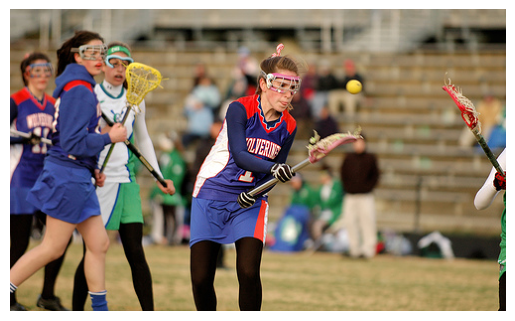

Схожие изображения согласно модели:


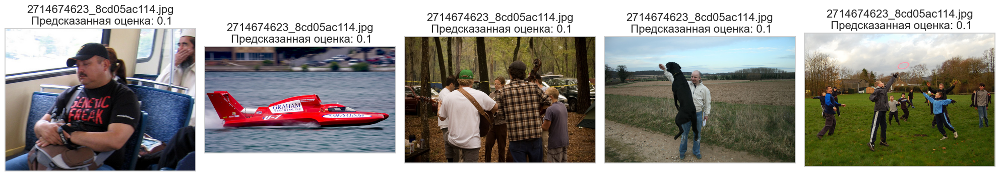



Имя файла:  191003283_992257f835.jpg
Описание:   A woman walks and a little boy walks to the side of her .

This image is unavailable in your country in compliance with local laws.


Имя файла:  2201192417_d934730fea.jpg
Описание:   a boy runs through the grass .

This image is unavailable in your country in compliance with local laws.


Имя файла:  2201192417_d934730fea.jpg
Описание:   A little boy in a green soccer uniform is running on the grass .

This image is unavailable in your country in compliance with local laws.


Имя файла:  2346402952_e47d0065b6.jpg
Описание:   Two women are operating a laptop connected to a camera in a parking lot with a third person standing by .

Искомое изображение:


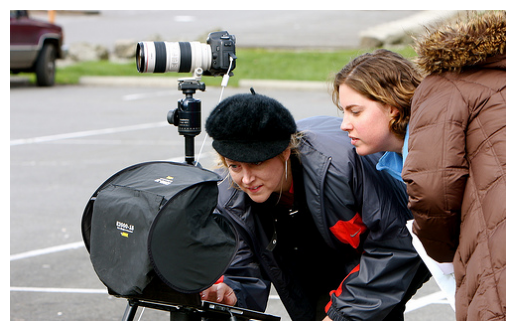

Схожие изображения согласно модели:


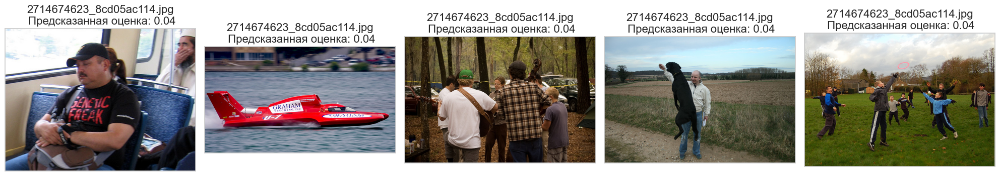



Имя файла:  2687672606_275169c35d.jpg
Описание:   A woman wearing jewelry holds a piece of paper and looks down .

Искомое изображение:


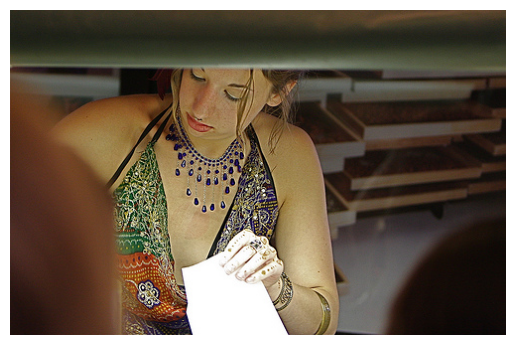

Схожие изображения согласно модели:


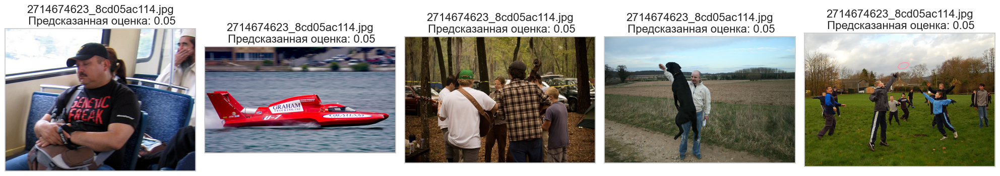



Имя файла:  3089107423_81a24eaf18.jpg
Описание:   Camera man in populated building taping an event .

Искомое изображение:


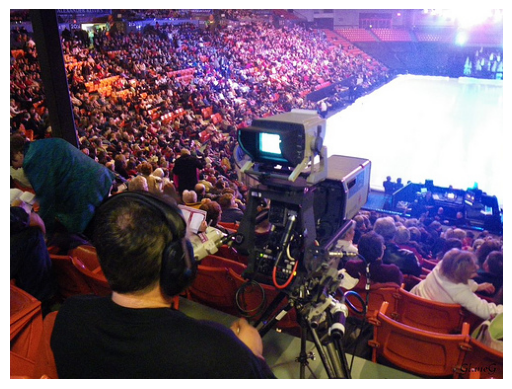

Схожие изображения согласно модели:


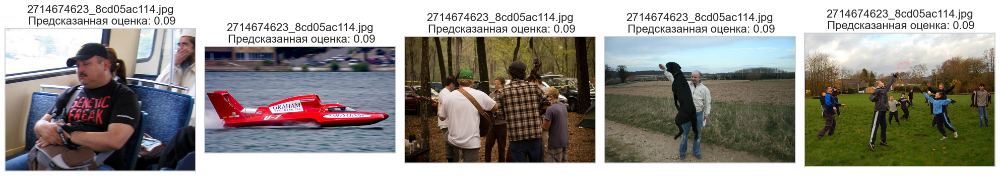



Имя файла:  3119913014_688d4997d7.jpg
Описание:   A man who is dressed like a wrestler walks while people take his picture .

Искомое изображение:


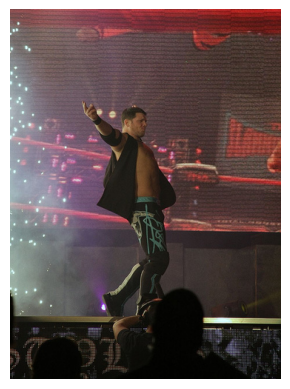

Схожие изображения согласно модели:


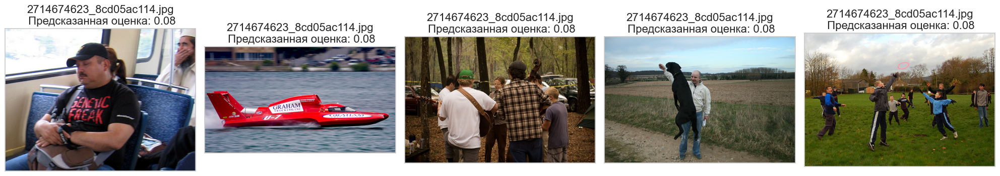



Имя файла:  3163198309_bbfe504f0a.jpg
Описание:   A skier coming over a snowy hill while people look on .

Искомое изображение:


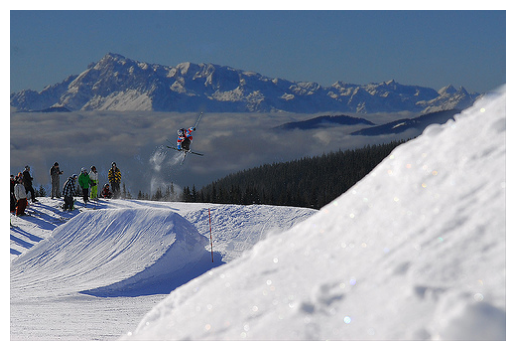

Схожие изображения согласно модели:


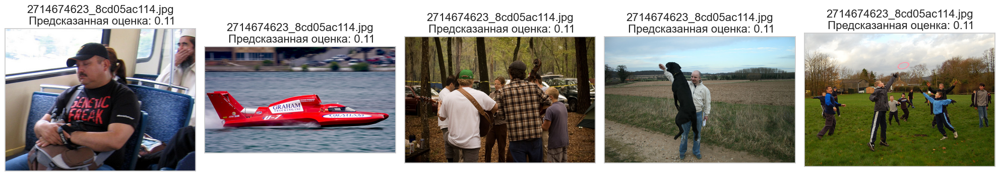



Имя файла:  782401952_5bc5d3413a.jpg
Описание:   Three teenagers drink Slurpees outside a convienience store .

This image is unavailable in your country in compliance with local laws.




In [ ]:
# 
for idx in sorted(random.sample(range(0, df_test_queries.shape[0]), 10)):
    
    # 
    img_file = df_test_queries.loc[idx, 'image']
    img_query = df_test_queries.loc[idx, 'query_text']
    
    # 
    print(
        # f'Индекс:     {idx}\n'
        f'Имя файла:  {img_file}\n'
        f'Описание:   {img_query}\n'
    )

    #
    if lemmatize_check(img_query) == 1: 
        
        print(
            color.BOLD + color.RED + 
            'This image is unavailable in your country in compliance with local laws.'
            + color. END
        )
    
    else:
        
        # 
        file_addr = dataset_path + 'test_images/'+ str(img_file)
        image = Image.open(file_addr)
        img_arr = np.array(image)
        
        print(color.BOLD + color.GREEN + 'Искомое изображение:' + color.END)
        
        # 
        plt.imshow(img_arr) 
        plt.axis('off')
        plt.show()


        # получаем эмбеддинг текста
        txt_embd = test_txt_embd[idx]
        
        # объединяем вектора тестовых картинок с эмбеддингом текста
        test_data = np.concatenate(
            ( 
                test_img_embd,
                np.resize(txt_embd, (test_img_embd.shape[0], len(txt_embd)))
            ), axis=1
        )
        
        # получаем предсказания
        test_pred = oscv.predict(test_data)
        # test_pred = net.forward(torch.FloatTensor(test_data))

        # 
        df_result = df_test_images.copy()
        df_result['pred_score'] = test_pred
        # df_result['pred_score'] = test_pred.detach().numpy()
        df_result = df_result.sort_values(by='pred_score', ascending=False).head(5).reset_index(drop=True)
        # display(df_result)

        # 
        print(color.BOLD + color.BLUE + 'Схожие изображения согласно модели:' + color.END)

        fig = plt.figure(figsize=(20, 6))
        for i in range(5):
            fig.add_subplot(
                1, 
                5, 
                i + 1, 
                title=str(df_result.loc[0, "image"]) + "\n Предсказанная оценка: " + str(round(df_result.loc[i, 'pred_score'], 2))
            )
            image = Image.open(dataset_path + 'test_images/' + str(df_result.loc[i, 'image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        plt.show()

    
    print('\n' + color.BOLD + color.BLUE + '='*100 + color.END + '\n')

В результате визуального тестирования точность работы модели оставляет желать лучшего.<br>
Необходима дальнейшая работа над улучшением качества.

## 9. Общий вывод

1. Заказчик проекта - фотохостинг для профессиональных фотографов «Со Смыслом» (“With Sense”). Пользователи сервиса размещают свои фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т. д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала.
<br><br>

2. Поставлена задача:<br>
Необходимо разработать демонстрационную версию поиска изображений по запросу. Для демонстрационной версии нужно выбрать лучшую  модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу. На основе лучшей модели можно будет собрать предварительную версию продукта, которую презентуют руководителю компании.
<br><br>

3. Выполнена загрузка файлов. Данные загружены верно, значения корректно распределены по столбцам, пропусков или значений в формате даты/времени не замечено:
    - `df_train_dataset` состоит из 5 822 строк и 3 столбцов;
    - `df_crowd_annotations` состоит из 47 830 строк и 5 столбцов;
    - `df_expert_annotations` состоит из 5 822 строк и 5 столбцов;
    - `df_test_images` состоит из 100 строк и 1 столбца;
    - `df_test_queries` состоит из 500 строк и 3 столбцов;
    - количество изображений в тренировочном датасете: 1000;
    - количество изображений в тестовом датасете: 100.
<br><br>

4. Результат исследовательского анализа:
    - пропуски отсутствуют;
    - типизация выполнена верно;
    - явных дубликатов не обнаружено;
    - выполнено преобразование значений доли людей, подтвердивших, что описание соответствует изображению: выражено в % и округлено до 2 знаков после запятой;
    - почти 88% людей, считают, что изображение и описание не подходят друг другу;
    - в опросах людей чаще всего опрашивали 3 человека, что совпадает с количеством оценок экспертов;
    - первый эксперт давал негативную оценку (1 и 2 балла) схожести картинки и описания в 90% случаев;
    - эксперт №2 также фиксировал отсутствие схожести в 86% случаев;
    - третий эксперт оставлял более позитивную оценку, и 21% изображений и описаний были подходящими (3 и 4 балла);
    - выполнили расчёт финальной оценки схожести картинки с описанием, учитывая мнение экспертов и опроса людей;
    - подготовили тренировочный датафрейм.
<br><br>

5. Выполнена проверка на наличие данных (описаний и изображений), включающих лиц не достигших 16 летнего возраста. Записи исключены из обучающего датасета.
<br><br>

6. Проведена векторизация изображений сразу для тренировочного и тестового датасета.
<br><br>

7. Проведена векторизация текстовых описаний сразу для тренировочного и тестового датасета.
<br><br>

8. Выполнено объединение эмбеддингов изображений и текстовых описаний для тренировочного датасета.
<br><br>

9. Осуществлено разбиение данных для обучения на тренировочную и валидационные выборки с помощью класса GroupShuffleSplit.
<br><br>

10. В качестве метрики выбрана RMSE. Выбор RMSE (корня среднеквадратичной ошибки) в качестве метрики обусловлен её простой интерпретируемостью (те же единицы измерения), чувствительностью к большим ошибкам, дифференцируемостью.
<br><br>

11. Для решения задачи регрессии воспользовались тремя моделями: линейная регрессия с регуляризацией - Ridge(), градиентный бустинг - CatBoostRegressor() и Полносвзяная нейронная сеть. В результате расчёт метрики RMSE на кросс-валидации и последующей оценки работы модели на валидационных данных получили следующие результаты:

    |Модель|Гиперпараметры|RMSE на CV*|RMSE на val**|
    |:-|:-|:-:|:-:|
    |Ridge|alpha = 2.5|0,220|0,210|
    |CatBoostRegressor|depth = 6, iterations = 100, learning_rate = 0.18|0,218|0,210|
    |Neural Network|epochs = 500, batch_size = 8000, learning_rate = 0.0005|0,218|0,213|

    <sub><i>
    \* RMSE на CV - метрика, рассчитанная на кросс-валидации (тренировочные данные).<br>
    ** RMSE на val - метрика, рассчитанная на валидационных данных.
    </i></sub><br><br>

    Лучший результат показала модель CatBoostRegressor, которую применили для дальнейшего тестирования.
<br><br>

12. В результате визуального тестирования точность работы модели оставляет желать лучшего. Необходима дальнейшая работа над улучшением качества.

## Бег-репорт

В процессе работы с данными багов, требующих внимания коллег, не обнаружено.